In [1]:
import pandas as pd
import pickle
from sklearn.neighbors import NearestNeighbors
import numpy as np
from tqdm import tqdm
import seaborn as sns
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
sns.set(font_scale = 1, style = 'darkgrid', rc={'figure.figsize':(7,5)})

In [2]:
#load dfs
researchers = pd.read_pickle("Files/Dataframes/researchers.pkl") 
sponsUnitResearchers = pd.read_pickle("Files/Dataframes/researchers_sponsoringUnits.pkl")

#load list with known sponsoring units from APS
with open('Files/knownDivisions.pkl', 'rb') as f:
    divisions = pickle.load(f)

In [825]:
#load dictionary with sponsoring units
with open('Files/sponsoringUnits_dictionary.pkl', 'rb') as f:
    sponsorDict = pickle.load(f)

## One-hot encoding

In [3]:
#get sponsoring units, and remove None and Unknown
#sponsoringUnits = sponsUnitResearchers.SponsoringUnits_all.unique().tolist()
#sponsoringUnits
#sponsoringUnits.remove('None')
#sponsoringUnits.remove('Unknown')
#sponsoringUnits.remove('and')

#sponsoringUnits
#remove and


#only use known divisions

In [4]:
#all sponsoring units in list, aggregate when it is same SearchName, Year and SessionType
#keep Seniority, CumulativePaperCount and Productivity as well
researchers_allSponUnit = sponsUnitResearchers.groupby(['SearchName', 'Year', 'SessionType'], as_index=False).agg({'SponsoringUnits_all': list, 'Seniority': 'first', 'CumulativePaperCount': 'first', 'Productivity': 'first', 'Gender': 'first'}).rename(columns = {'AssignedSponsoringUnit': 'SponsoringUnits_all'})

In [5]:
#one-hot encoding
mlb = MultiLabelBinarizer(sparse_output=True)

oneHot = researchers_allSponUnit.join(pd.DataFrame.sparse.from_spmatrix(
    mlb.fit_transform(researchers_allSponUnit.pop('SponsoringUnits_all')),
    index = researchers_allSponUnit.index, 
    columns = mlb.classes_))

In [20]:
#select columns 
cols = list(researchers_allSponUnit.columns) #continous variables 
oneHot_cols = list(set(oneHot.columns) & set(divisions)) #sponsoring units that is one-hot encoded
cols += oneHot_cols #all variables 

In [21]:
#df with researcher with one-hot encoded sponsoring units
oneHot_researchers = oneHot[cols]

In [22]:
#columns for KNN
allCols = oneHot_cols
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

In [23]:
#save df
oneHot_researchers.to_pickle("Files/Dataframes/researchers_oneHot.pkl")
#allCols

In [24]:
#save allCols list
with open('Files/KNN_cols', 'wb') as f:
    pickle.dump(allCols, f)

In [ ]:
When removing productivity, we still have information about it, same goes for paper count
Removing sponsoring units: we compare across sponsoring units, where likelihood might differ


## Functions

In [29]:
def standardizeColumn(df, columnName):
    standardizedColumn = (df[columnName] - df[columnName].mean())/(df[columnName].std())
    
    return standardizedColumn

In [30]:
def KNN(df, groupFeature, groups, K, distanceMetric, oneHotFeatures_n, standardizeFeatures_n, allFeatures):
    group1 = df[df[groupFeature] == groups[0]].reset_index(drop = True)
    group2 = df[df[groupFeature] == groups[1]].reset_index(drop = True)
    
    oneHot_weight = np.repeat(1/oneHotFeatures_n, oneHotFeatures_n) #weight for one-hot encoded features
    other_weight = np.repeat(1, standardizeFeatures_n) #weight for the other features
    weights = np.hstack((oneHot_weight, other_weight)) 
    
    if distanceMetric == 'minkowski':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'euclidean':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 2, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'manhattan':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 1, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy())
    
    indices = kNeighbor_ind.copy().astype(float)

    return kNeighbor_dist, indices, group1, group2

In [31]:
def KNN_changeFeatures(df, groupFeature, groups, K, distanceMetric, oneHotFeatures_n, standardizeFeatures_n, allFeatures):
    group1 = df[df[groupFeature] == groups[0]].reset_index(drop = True)
    group2 = df[df[groupFeature] == groups[1]].reset_index(drop = True)
    
    if oneHotFeatures_n > 0:
        oneHot_weight = np.repeat(1/oneHotFeatures_n, oneHotFeatures_n) #weight for one-hot encoded features
        other_weight = np.repeat(1, standardizeFeatures_n) #weight for the other features
        weights = np.hstack((oneHot_weight, other_weight)) 
    else:
        weights =  np.repeat(1, standardizeFeatures_n) #weight for the other features
    
    if distanceMetric == 'minkowski':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'euclidean':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 2, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'manhattan':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 1, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy())
    
    indices = kNeighbor_ind.copy().astype(float)

    return kNeighbor_dist, indices, group1, group2


In [32]:
def getDistances(df, K, distanceMetric, allFeatures, q):
    distanceDict = {}
    
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for y in yearList:
        year_df = researchers[researchers.Year == y] #filter by year
        distances, indices, females, males = KNN(year_df, 'Gender', ['Female', 'Male'], K, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures)
        
        threshold = np.quantile(distances.flatten(), q) #q quantile
        indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
        
        distanceDict[y] = {'Distances': distances, 'Threshold': threshold}
    return distanceDict   

In [33]:
def plotYearlyDistance(dict_, metric, K):
    Years = dict_.keys()
    for y in Years:
        distance = dict_[y]['Distances'].flatten()
        threshold = dict_[y]['Threshold']
        df = pd.DataFrame(distance, columns = ['Distance'])
        sns.histplot(df, x = 'Distance', stat = 'proportion')
        plt.axvline(x = threshold, color = 'black', linewidth = 1.3, label = "Distance threshold: " + "{:.2f}".format(threshold)).set_linestyle("--")
        plt.legend()
        plt.xscale('log')
        plt.yscale('log')
        plt.savefig('Figures/KNN_distance_' + metric + str(y) + "_K_" + str(K) + '.png', bbox_inches='tight')
        plt.show()

In [34]:
def getRatio(indices, df1, df2, suffixes, feature): #df1 is females/attendees, df2 is males/invited
    similarResearchers_df = pd.DataFrame(data = df2[feature]) #group 2
    index_rand = [np.random.choice(i, 1)[0] for i in indices] #randomly select index for each row
    similarResearchers_df['SimilarIndex'] = index_rand #create column with the random similar indices
    similarResearchers_df = similarResearchers_df.dropna(subset = 'SimilarIndex') #drop rows where the researchers are not similar enough
    similar = df1.iloc[similarResearchers_df.SimilarIndex][[feature]] #the random selected similar researchers
    similarResearchers = pd.merge(similarResearchers_df, similar, left_on = 'SimilarIndex', right_on = similar.index, how = 'inner', suffixes=(suffixes[1], suffixes[0]))
    
    #calculate ratio
    g1_ratio = similarResearchers[feature + suffixes[0]].value_counts(normalize = True)
    g2_ratio = similarResearchers[feature + suffixes[1]].value_counts(normalize = True)
    
    return g1_ratio, g2_ratio

In [343]:
#get ratio, but for all within threshold(not a randomly chosen researcher)
def getRatio_all(feature, suffix, indices, df1, df2):
    neighbor_df = pd.DataFrame() 
    neighbor_df[feature + suffix] = df2[feature] #feature of group2 
#    neighbor_df['PotentialSpeaker_index'] = indices.tolist() #index of potential speakers
    neighbor_df['SimilarIndex'] = indices.tolist() #index of similar researchers(from group 1)
    neighbor_index = neighbor_df.explode('SimilarIndex').dropna() #get row per similar researcher from group 1 + drop NaN
    neighbor_index['SimilarIndex'] = neighbor_index.SimilarIndex.astype(int) #index as integer
    neighbor_index = neighbor_index.reset_index().rename(columns = {'index': 'g2Index'})
    group1_feature = df1[[feature]] #feature of group1
    
    similarMatch = pd.merge(neighbor_index, group1_feature, left_on = 'SimilarIndex', right_on = group1_feature.index, how = 'inner') #get feature of group1
    
    return similarMatch

In [318]:
def getRatio_potentialSpeakers(genderMatch, df2):
    #neighbor_df = pd.DataFrame() 
    #neighbor_df['Gender_inv'] = df2['Gender'] #gender of invited speakers
    #neighbor_df['PotentialSpeaker_index'] = indices.tolist() #index of potential speakers
    #neighbor_index = neighbor_df.explode('PotentialSpeaker_index').dropna() #get row per potential speaker + drop NaN
    #neighbor_index['PotentialSpeaker_index'] = neighbor_index.PotentialSpeaker_index.astype(int)
    #group1_gender = df1[['Gender']] #gender of attendees
    
    #genderMatch = pd.merge(neighbor_index, group1_gender, left_on = 'PotentialSpeaker_index', right_on = group1_gender.index, how = 'inner') #get gender of potential speakers
    
    potentialFemales_ratio = genderMatch.Gender.value_counts(normalize = True)['Female'] #ratio of potential female speakers
    potentialMales_ratio = genderMatch.Gender.value_counts(normalize = True)['Male'] #ratio of potential male speakers
    femaleSpeakers_ratio = len(df2[df2.Gender == 'Female'])/len(df2)
    maleSpeakers_ratio = len(df2[df2.Gender == 'Male'])/len(df2)
    
    genderMatch['GenderMatch'] = genderMatch.Gender_inv + ", " + genderMatch.Gender #get column with match of invited speaker and potential speaker
    femaleMatches = len(genderMatch[genderMatch.Gender_inv == 'Female']) #female matches(invited females x number of neighbors)
    maleMatches = len(genderMatch[genderMatch.Gender_inv == 'Male']) #male matches(invited males x number of neighbors)
    
    genderCount = genderMatch.groupby('GenderMatch').size().reset_index().rename(columns = {0: 'Count'}) #count of gender relations
    genderRelation_list  = genderMatch.GenderMatch.unique().tolist()  #list with gender relations
    genderRelation_dict = {}
    for i in genderRelation_list: #create dict with gender relation and number of matches
        if i.startswith('Female'):
            genderRelation_dict [i] = femaleMatches
        else:
            genderRelation_dict [i] = maleMatches

    genderRelation_df = pd.DataFrame.from_dict(genderRelation_dict , orient='index', columns = ['Total']) #df with female/male matches assigned to gender relation
    
    #create df with ratio for gender relation
    genderRelation = pd.merge(genderCount, genderRelation_df, left_on = 'GenderMatch', right_on = genderRelation_df.index, how = 'inner') #get gender of potential speakers
    genderRelation['Ratio'] = genderRelation['Count']/genderRelation['Total']
    
    relationRatio = dict(zip(genderRelation.GenderMatch,genderRelation.Ratio)) #ratio for each gender relationship
    
    return potentialFemales_ratio, potentialMales_ratio, femaleSpeakers_ratio, maleSpeakers_ratio, relationRatio

In [35]:
#old- delete
def getRatio_potentialSpeakers(indices, df1, df2):
    #neighbor_df = pd.DataFrame() 
    #neighbor_df['Gender_inv'] = df2['Gender'] #gender of invited speakers
    #neighbor_df['PotentialSpeaker_index'] = indices.tolist() #index of potential speakers
    #neighbor_index = neighbor_df.explode('PotentialSpeaker_index').dropna() #get row per potential speaker + drop NaN
    #neighbor_index['PotentialSpeaker_index'] = neighbor_index.PotentialSpeaker_index.astype(int)
    #group1_gender = df1[['Gender']] #gender of attendees
    
    #genderMatch = pd.merge(neighbor_index, group1_gender, left_on = 'PotentialSpeaker_index', right_on = group1_gender.index, how = 'inner') #get gender of potential speakers
    
    potentialFemales_ratio = genderMatch.Gender.value_counts(normalize = True)['Female'] #ratio of potential female speakers
    potentialMales_ratio = genderMatch.Gender.value_counts(normalize = True)['Male'] #ratio of potential male speakers
    femaleSpeakers_ratio = len(df2[df2.Gender == 'Female'])/len(df2)
    maleSpeakers_ratio = len(df2[df2.Gender == 'Male'])/len(df2)
    
    genderMatch['GenderMatch'] = genderMatch.Gender_inv + ", " + genderMatch.Gender #get column with match of invited speaker and potential speaker
    femaleMatches = len(genderMatch[genderMatch.Gender_inv == 'Female']) #female matches(invited females x number of neighbors)
    maleMatches = len(genderMatch[genderMatch.Gender_inv == 'Male']) #male matches(invited males x number of neighbors)
    
    genderCount = genderMatch.groupby('GenderMatch').size().reset_index().rename(columns = {0: 'Count'}) #count of gender relations
    genderRelation_list  = genderMatch.GenderMatch.unique().tolist()  #list with gender relations
    genderRelation_dict = {}
    for i in genderRelation_list: #create dict with gender relation and number of matches
        if i.startswith('Female'):
            genderRelation_dict [i] = femaleMatches
        else:
            genderRelation_dict [i] = maleMatches

    genderRelation_df = pd.DataFrame.from_dict(genderRelation_dict , orient='index', columns = ['Total']) #df with female/male matches assigned to gender relation
    
    #create df with ratio for gender relation
    genderRelation = pd.merge(genderCount, genderRelation_df, left_on = 'GenderMatch', right_on = genderRelation_df.index, how = 'inner') #get gender of potential speakers
    genderRelation['Ratio'] = genderRelation['Count']/genderRelation['Total']
    
    relationRatio = dict(zip(genderRelation.GenderMatch,genderRelation.Ratio)) #ratio for each gender relationship
    
    return potentialFemales_ratio, potentialMales_ratio, femaleSpeakers_ratio, maleSpeakers_ratio, relationRatio

In [1005]:
def likelihood(ratio_group1, ratio_group2, feature):

    if feature in ratio_group1.index:
        group1_p = ratio_group1.loc[feature]
    else:
        group1_p = 0
        
    if feature in ratio_group2.index:
        group2_p = ratio_group2.loc[feature]
    else:
        group2_p = 0
    
    #if group1_p == 0:
     #   likelihood_n = 0
    #else:
    #if (group1_p + group2_p) == 0:
    #    print("error")
    #likelihood_n = group1_p/(group1_p + group2_p)
    try:
        likelihood_n = group1_p/group2_p
    except:
        likelihood_n = "error"
    
    return likelihood_n

In [37]:
def getStats_likelihood(df, parameter):
    avg = df.groupby([parameter, 'Year']).mean()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'Avg_likelihood'})
    std = df.groupby([parameter, 'Year']).std()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'STD_likelihood'})
    sem = df.groupby([parameter, 'Year']).sem()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'SEM_likelihood'})

    stats_df = avg.merge(std, how = 'inner', on = [parameter, 'Year'])
    stats_df = stats_df.merge(sem, how = 'inner', on = [parameter, 'Year'])
    
    return stats_df

In [628]:
def likelihoodEvolution(df, allFeatures, K, groupFeature, groups, distanceMetric, Q, N, suffixes):
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    resultDict = {}
    genderRelation_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for k in tqdm(K):
        for q in tqdm(Q):
            for y in yearList:
                year_df = researchers[researchers.Year == y] #filter by year
                if groupFeature == 'Gender': #for comparing invited wrt. gender
                    analysisFeature = 'SessionType'
                    distances, indices, group1, group2 = KNN(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
                     #calculate likelihood
                        
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        resultDict[index] = {'K': k, 'q': q, 'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
                        
                elif groupFeature == 'SessionType': #for finding potential speakers
                    analysisFeature = 'Gender'
                    distances, indices, group1, group2 = KNN(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if 
                
                    similarMatch = getRatio_all(analysisFeature, '_inv', indices, group1, group2)
                    potentialFemales, potentialMales, femaleSpeakers, maleSpeakers, genderRelation = getRatio_potentialSpeakers(similarMatch, group2)
                    #potentialFemales, potentialMales, femaleSpeakers, maleSpeakers, genderRelation = getRatio_potentialSpeakers(indices, group1, group2) #get ratio of potential speakers
                                                                                                        
                    
                
                    genderRelation_dict[y] = genderRelation
                    resultDict[index] = {'Year': y, 'PotentialFemaleSpeakers_ratio': potentialFemales, 'PotentialMaleSpeakers_ratio': potentialMales, 'FemaleSpeakers': femaleSpeakers, 'MaleSpeakers': maleSpeakers}
                    index += 1
                    
    result_df = pd.DataFrame.from_dict(resultDict, orient = 'index') #create df with likelihood 
    if groupFeature == 'SessionType':    
        genderRelation_df = pd.DataFrame.from_dict(genderRelation_dict, orient = 'index') #create df with normalized gender matches
        return result_df, genderRelation_df
    else:
        return result_df

In [39]:
#likelihood calculation where features is changed
def likelihoodEvolution_changeFeatures(df, allFeatures, K, groupFeature, groups, distanceMetric, Q, N, suffixes):
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    standardizeFeatures_present = []
    for i in standardizeFeatures:
        if i in allFeatures:
            standardizeFeatures_present.append(i) #select the features present in the features
            
    n_oneHotFeatures = len(allFeatures) - len(standardizeFeatures_present) #number of features from one-hot encoding
                                    
    likelihood_dict = {}
    index = 0
    
    for c in standardizeFeatures_present:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for k in K:
        for q in Q:
            for y in tqdm(yearList):
                year_df = researchers[researchers.Year == y] #filter by year
                if groupFeature == 'Gender':
                    analysisFeature = 'SessionType'
                    distances, indices, group1, group2 = KNN_changeFeatures(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures_present), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
                
                #calculate likelihood
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        likelihood_dict[index] = {'K': k, 'q': q, 'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
                        
    likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood     
    return likelihood_df

In [73]:
def plotLikelihood(df_list, colors, errorbar, ylabel, labels, title):
    years = df_list[0].Year.tolist()
    for i in range(0,len(df_list)):
        sns.lineplot(data = df_list[i], x = 'Year', y = 'Avg_likelihood', marker = 'o', color = colors[i], label =labels[i])
        if errorbar == True:
            plt.errorbar(x = df_list[i].Year, y = df_list[i].Avg_likelihood, yerr = df_list[i].SEM_likelihood, color = colors[0], capsize = 4)
    plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
    if len(df_list) >= 6:
        plt.legend(ncol = 3)
    else: 
        plt.legend()
    plt.xticks(np.arange(min(years), max(years)+1, 2.0))
    plt.ylabel(ylabel)
    plt.savefig("Figures/" + title + "_", bbox_inches = 'tight')

In [817]:
def plotLikelihood_wTitle(df_list, colors, errorbar, ylabel, labels, plotTitle, title):
    years = df_list[0].Year.tolist()
    for i in range(0,len(df_list)):
        sns.lineplot(data = df_list[i], x = 'Year', y = 'Avg_likelihood', marker = 'o', color = colors[i], label =labels[i])
        if errorbar == True:
            plt.errorbar(x = df_list[i].Year, y = df_list[i].Avg_likelihood, yerr = df_list[i].SEM_likelihood, color = colors[0], capsize = 4)
    plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
    if len(df_list) >= 6:
        plt.legend(ncol = 3)
    else: 
        plt.legend()
    plt.xticks(np.arange(min(years), max(years)+1, 2.0))
    plt.ylabel(ylabel)
    plt.title(plotTitle, fontsize = 15)
    plt.savefig("Figures/" + title + "_", bbox_inches = 'tight')

In [225]:
#filter on seniority
def likelihoodEvolutions_seniority(df, allFeatures, groups, K, distanceMetric, q, N, suffixes, analysisFeature): 
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    likelihood_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for y in tqdm(yearList):
        year_df = researchers[researchers.Year == y] #filter by year
        seniorityLabels = year_df.Seniority_cat.unique().tolist()
        for i in seniorityLabels:
            cat_df = year_df[year_df.Seniority_cat == i] #filter by seniority category
            
            distances, indices, group1, group2 = KNN(cat_df, 'Gender', groups, K, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
            threshold = np.quantile(distances.flatten(), q) #q quantile
            indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
            for n in range(0, N): #calculate likelihood
                ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                lh = likelihood(ratio1, ratio2, 'invited')
                likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Iteration': n, 'Likelihood': lh}
                index += 1
                
    likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood     
    return likelihood_df

In [904]:
def matchRatio_wSeniority(df, allFeatures, groups, K, distanceMetric, q, analysisFeature):
    researchers  =df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    ratio_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for y in tqdm(yearList):
        year_df = researchers[researchers.Year == y] #filter by year
        seniorityLabels = year_df.Seniority_cat.unique().tolist()
        for i in seniorityLabels:
            cat_df = year_df[year_df.Seniority_cat == i] #filter by seniority category
            
            distances, indices, group1, group2 = KNN(cat_df, 'Gender', groups, K, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
            threshold = np.quantile(distances.flatten(), q) #q quantile
            indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
            
            similarMatch = getRatio_all(analysisFeature, '_g2', indices, group1, group2)
            indexSessCount = similarMatch.groupby(['g2Index', 'SessionType']).count().reset_index()
            matchRatio = len(indexSessCount[indexSessCount.SessionType == 'invited']) / len(similarMatch.g2Index.unique())
            ratio_dict[index] = {'Year': y, 'Seniority': i, 'MatchRatio': matchRatio}
            index += 1
            
    ratioInv_df = pd.DataFrame.from_dict(ratio_dict, orient = 'index') #create df with ratio
    return ratioInv_df

In [210]:
def plotSeniority_varyParameters(df_list, parameterList, colors, title):
    for y in df_list[0].Year.unique():
        for i in range(0, len(df_list)):
            df = df_list[i]
            year_df = df[df.Year == y]
            sns.lineplot(data = year_df, x = 'Seniority', y = 'Avg_likelihood', marker = 'o', ci = None, label = parameterList[i], color  = colors[i])
        plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
        plt.legend(ncol = 2)
        plt.savefig('Figures/' + title + str(y), bbox_inches='tight')
        plt.show()

In [444]:
#heatmap grouped by year and seniority
def avgLikelihood_heatmap(df, title, color, col, minVal):
    pivotTable = df.pivot(index = 'Year', columns = 'Seniority', values = col)
    xlabels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']
    sns.heatmap(pivotTable, annot = True, xticklabels = xlabels, cmap = color, vmin = minVal)
    plt.savefig('Figures/' + title, bbox_inches='tight')
    plt.show()

In [1006]:
def relativeLikelihood_sponsoringUnits(sponsoringUnits, df, likelihoodGender, features, groups, suffixes, color, yaxis, sponsUnitDict):
    likelihoodUnits = pd.DataFrame()
    for i in tqdm(range(0, len(sponsoringUnits))):
        unit = sponsoringUnits[i]
        sponsUnitData = df[df[unit] == 1]
        groupCount = sponsUnitData[['SearchName','Year', 'Gender', 'SessionType']].groupby(['Year', 'Gender']).count().reset_index() #table of count per year and gender
        duplicatedYears = groupCount[groupCount.duplicated(subset = 'Year')] #number of duplicated years
        nYears = len(groupCount.Year.unique()) #number of years
        if len(duplicatedYears) < nYears: #if some year(s) only have 1 gender
            minGroupSize = 0 
        else:
            minGroupSize = groupCount[groupCount.Gender == likelihoodGender].min()['SearchName'] #size of smallest group(grouped by year and gender)
        if minGroupSize <= 5:
            continue
        elif minGroupSize <= 70:
            if minGroupSize <= 20:
                K = 10
            else:
                K = 25
        else:
            K = 50
        
        #do KNN on sponsUnitData
        likelihood_sponsoringUnit = likelihoodEvolution(sponsUnitData, features, [K], 'Gender', groups, 'manhattan', [0.5], 1000, suffixes)
        if len(likelihood_sponsoringUnit[likelihood_sponsoringUnit.Likelihood == 'error']) == 0: #if no errors in calculating likelihood
            #get stats
            likelihoodStats = getStats_likelihood(likelihood_sponsoringUnit, 'K')
            likelihoodStats['SponsoringUnit'] = unit
            likelihoodUnits = pd.concat([likelihoodUnits, likelihoodStats])
            #plot relative likelihood
            plotLikelihood_wTitle([likelihoodStats], [color], True, 'Likelihood of similar female invitation', [''], sponsUnitDict[unit], likelihoodGender + "Likelihood_" + unit)
        else:
            print(unit)
            
        plt.show()
    return likelihoodUnits

### Varying distance metric

In [63]:
EuclideanDistance = getDistances(oneHot_researchers, 10, 'euclidean', allCols, 0.5)
ManhattanDistance = getDistances(oneHot_researchers, 10, 'manhattan', allCols, 0.5)
MinkowskiDistance = getDistances(oneHot_researchers, 10, 'minkowski', allCols, 0.5)

In [64]:
#save distance dicts
with open('Files/Dictionary/EculideanDistance.pkl', 'wb') as f:
    pickle.dump(EuclideanDistance, f)
    
with open('Files/Dictionary/ManhattanDistance.pkl', 'wb') as f:
    pickle.dump(ManhattanDistance, f)
    
with open('Files/Dictionary/MinkowskiDistance.pkl', 'wb') as f:
    pickle.dump(MinkowskiDistance, f)

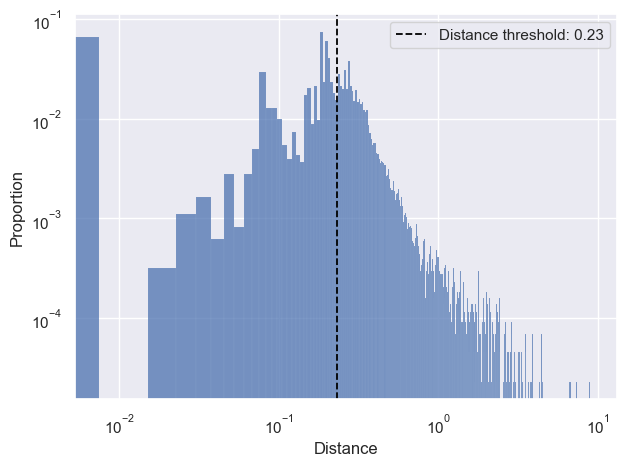

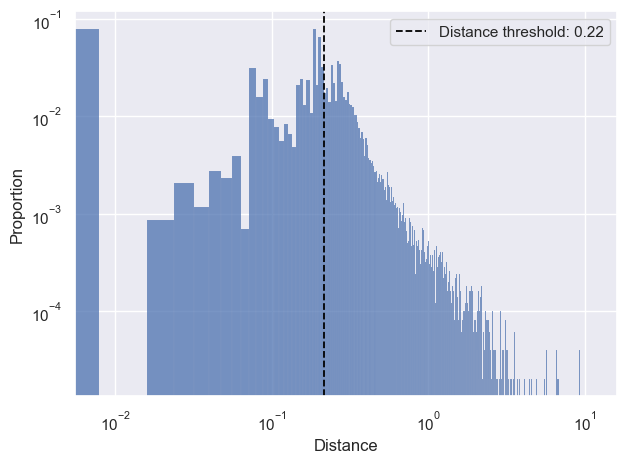

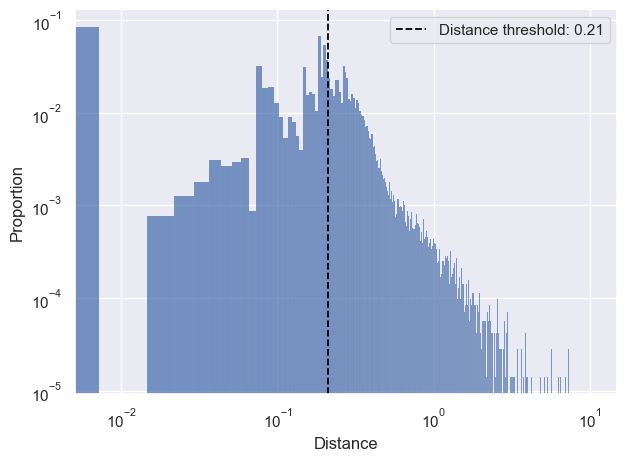

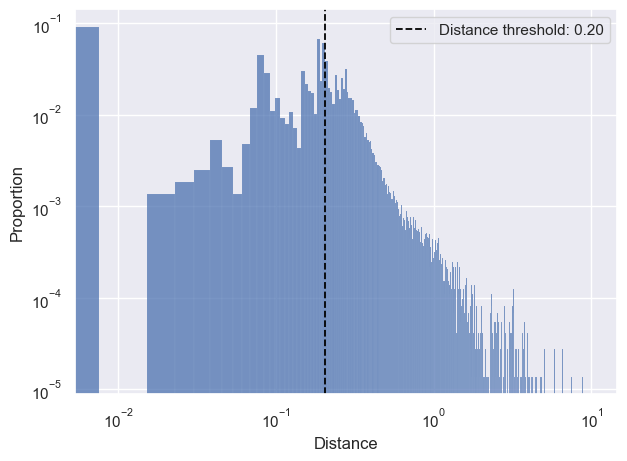

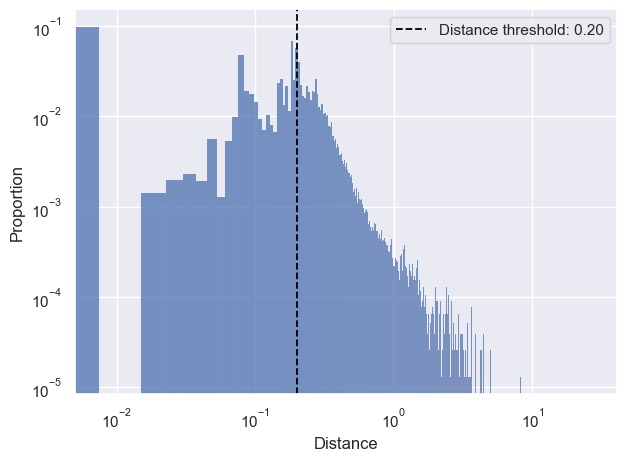

...

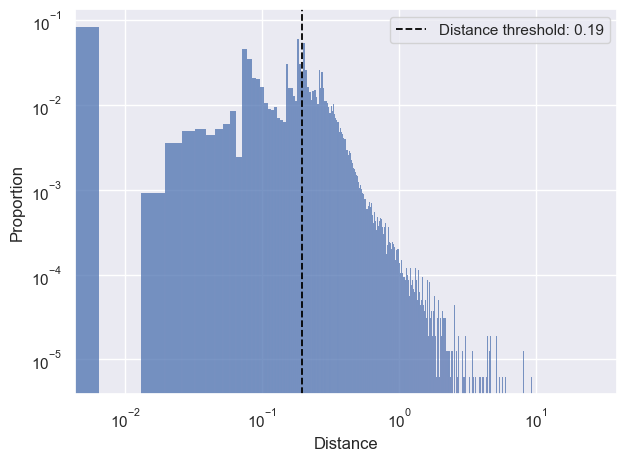

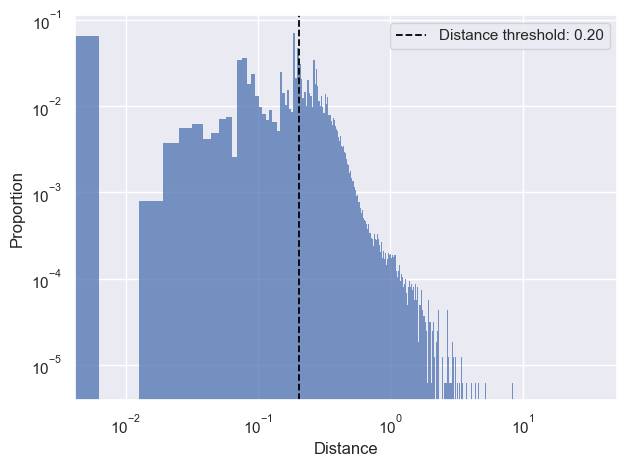

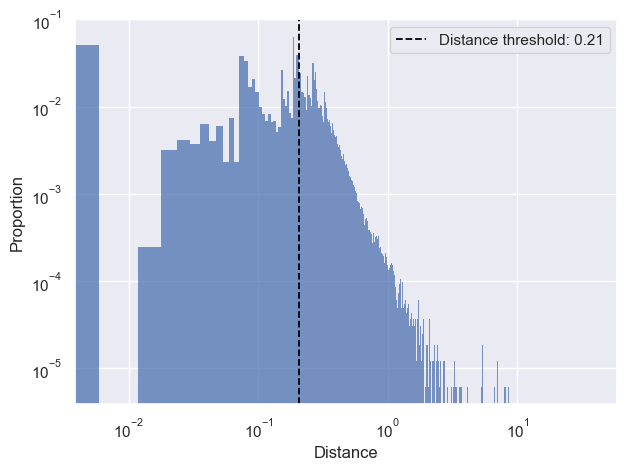

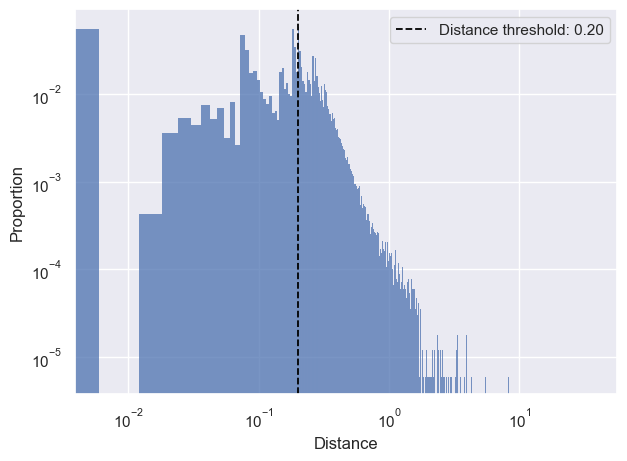

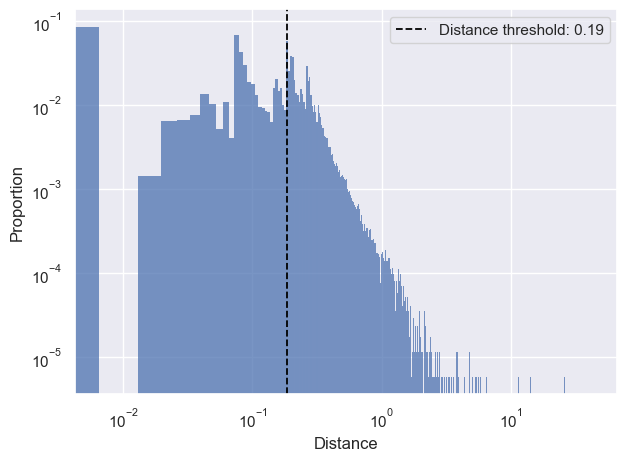

In [65]:
plotYearlyDistance(EuclideanDistance, 'manhattan', 10)

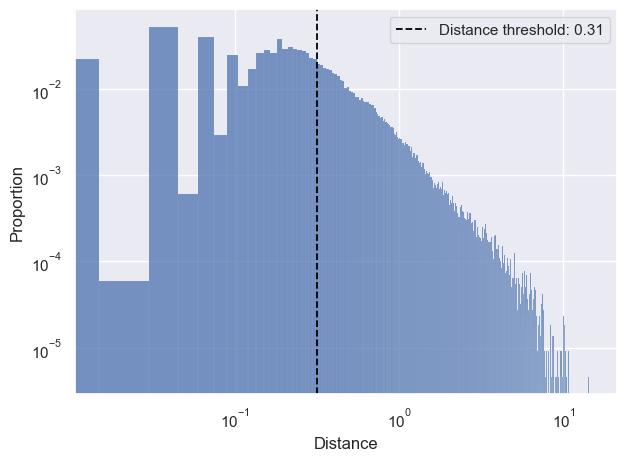

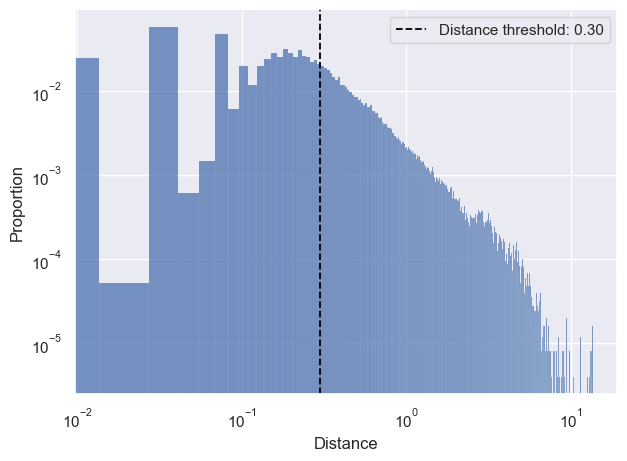

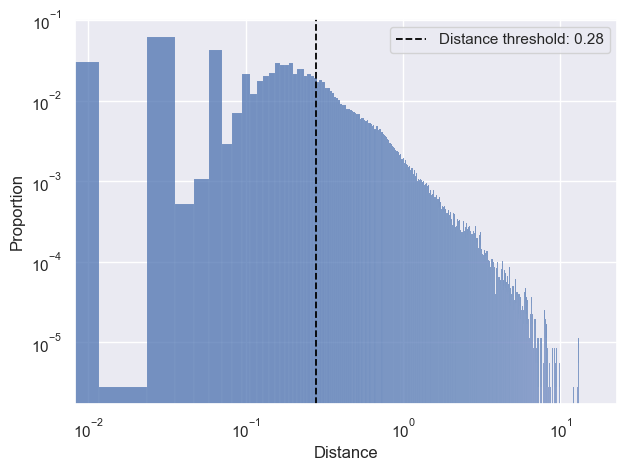

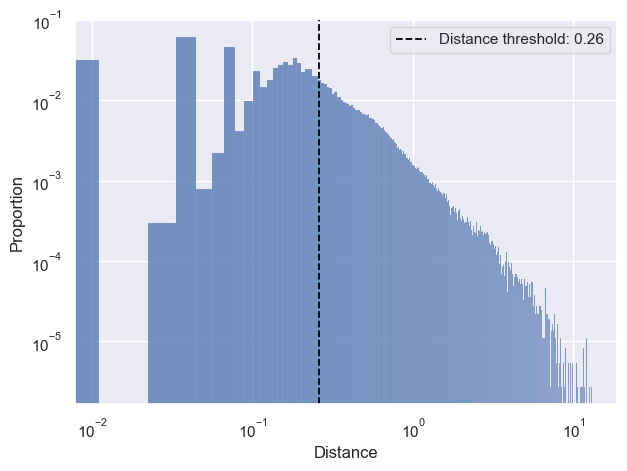

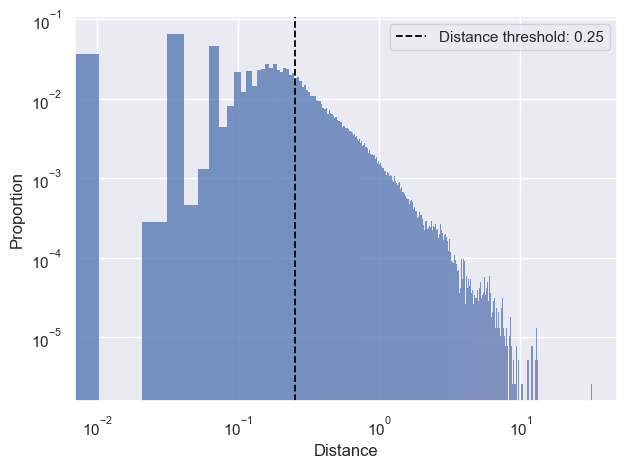

...

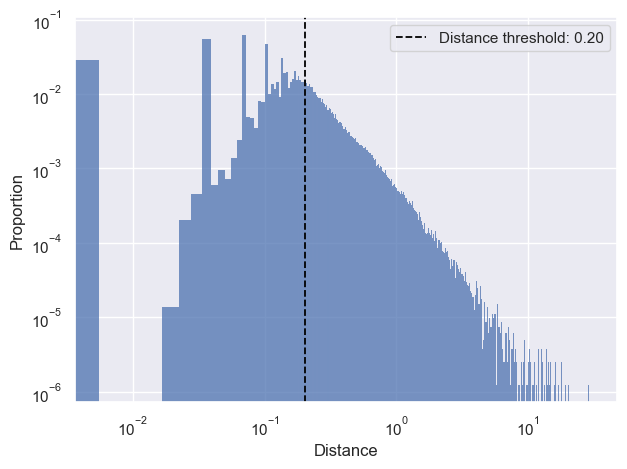

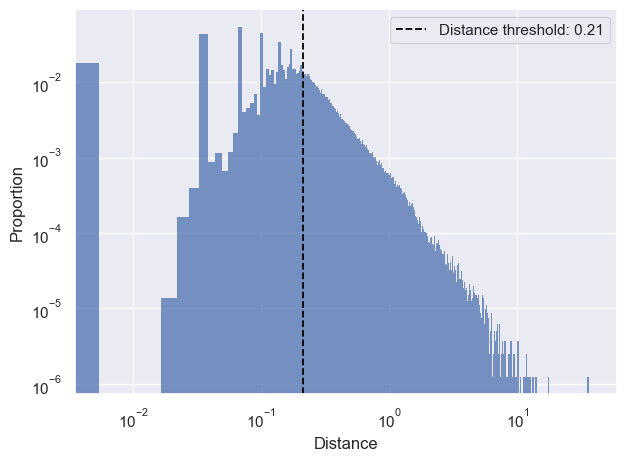

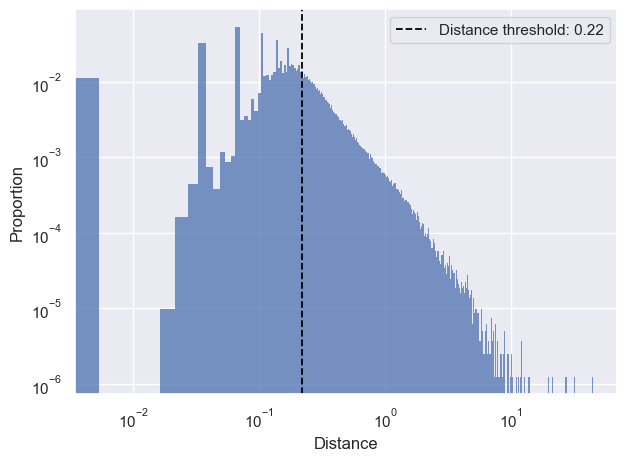

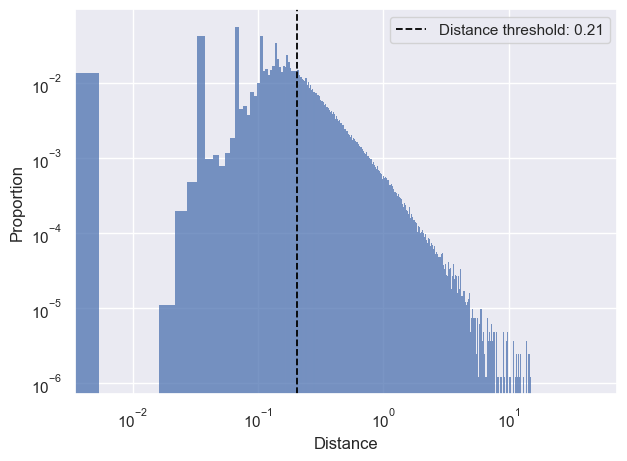

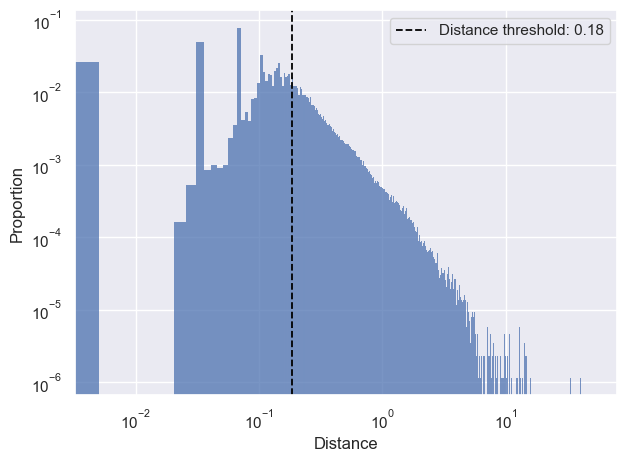

In [66]:
manhattan50Dist = getDistances(oneHot_researchers, 50, 'manhattan', allCols, 0.5)
plotYearlyDistance(manhattan50Dist, 'manhattan', 50)

In [67]:
euclideanLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'euclidean', [0.5], 1000, ['_F', '_M'])
manhattanLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
minkowskiLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'minkowski', [0.5], 1000, ['_F', '_M'])

100%|█████████████████████████████████████████| 1/1 [1:04:37<00:00, 3877.06s/it]


In [68]:
#save dfs as pickle
euclideanLikelihood.to_pickle("Files/Dataframes/euclideanLikelihood.pkl")  
manhattanLikelihood.to_pickle("Files/Dataframes/manhattanLikelihood.pkl")  
minkowskiLikelihood.to_pickle("Files/Dataframes/minkowskiLikelihood.pkl")  

In [69]:
euclideanStats = getStats_likelihood(euclideanLikelihood, 'K')
manhattanStats = getStats_likelihood(manhattanLikelihood, 'K')
minkowskiStats = getStats_likelihood(minkowskiLikelihood, 'K')

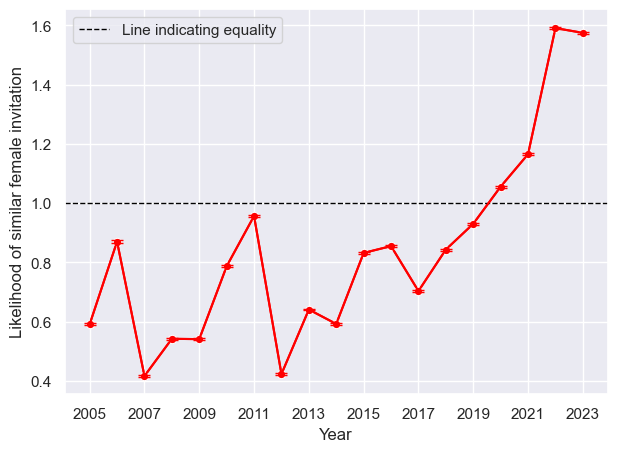

In [74]:
plotLikelihood([manhattanStats], ['red'], True, 'Likelihood of similar female invitation', [''], 'manhattanKNN_10K')

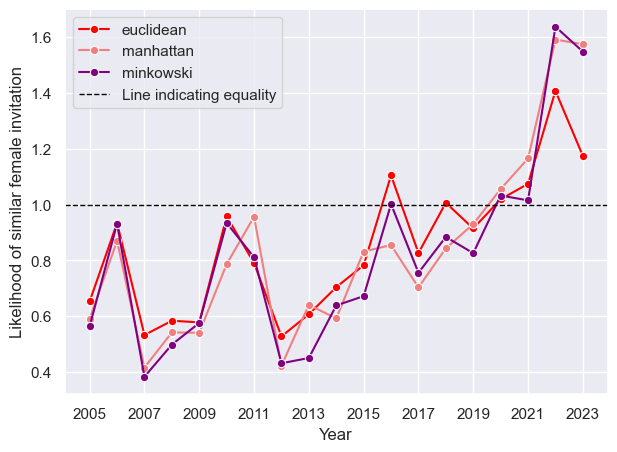

In [75]:
plotLikelihood([euclideanStats, manhattanStats, minkowskiStats], ['red', 'lightcoral', 'purple'], False, 'Likelihood of similar female invitation', ['euclidean', 'manhattan', 'minkowski'], 'metricsKNN_10K')

### Varying K

In [76]:
varyK_df = likelihoodEvolution(oneHot_researchers, allCols, [2, 5, 10, 20, 40, 50, 80, 100], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])

100%|████████████████████████████████████████| 8/8 [11:04:44<00:00, 4985.54s/it]


In [77]:
#save df as pickle
varyK_df.to_pickle("Files/Dataframes/likelihood_varyK.pkl")  

In [78]:
varyK_Stats = getStats_likelihood(varyK_df, 'K')

In [922]:
kList = varyK_Stats.K.unique().tolist()
k2 = varyK_Stats[varyK_Stats.K == 2]
k5 = varyK_Stats[varyK_Stats.K == 5]
k10 = varyK_Stats[varyK_Stats.K == 10]
k20 = varyK_Stats[varyK_Stats.K == 20]
k40 = varyK_Stats[varyK_Stats.K == 40]
k50 = varyK_Stats[varyK_Stats.K == 50]
k80 = varyK_Stats[varyK_Stats.K == 80]
k100 = varyK_Stats[varyK_Stats.K == 100]

In [923]:
colors = ['grey', 'firebrick', 'fuchsia', 'sandybrown', 'darkgreen', 'mediumslateblue', 'red', 'lightcoral']

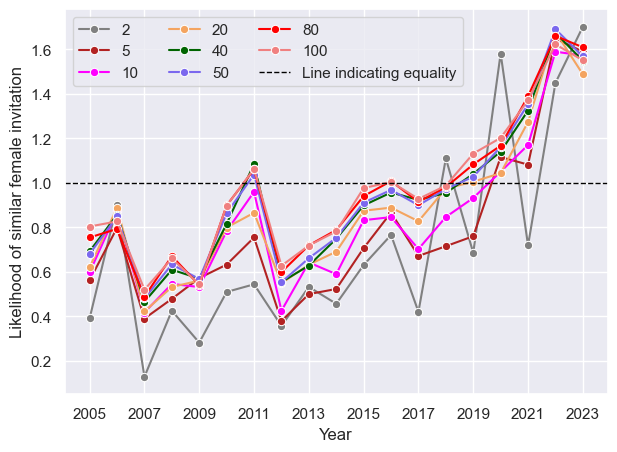

In [940]:
plotLikelihood([k2, k5 ,k10, k20, k40, k50, k80, k100], colors, False, 'Likelihood of similar female invitation', kList, 'varyK_KNN_manhattan')

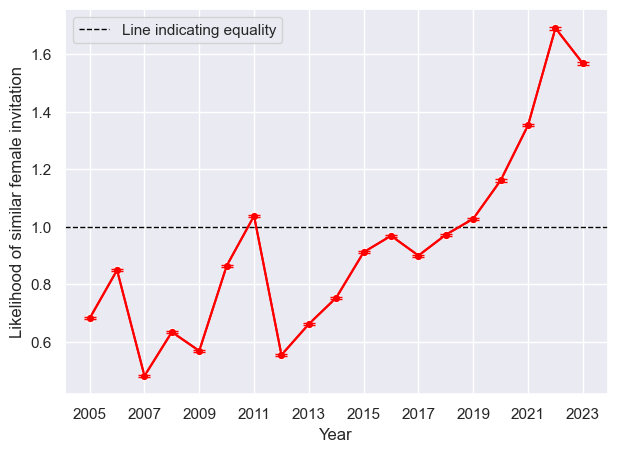

In [82]:
#likelihood for K = 50, metric = manhattan
plotLikelihood([k50], ['red'], True, 'Likelihood of similar female invitation', [''], 'manhattanKNN_50K')

#### Check metric for K = 50

In [97]:
euclidean50Likelihood = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Female', 'Male'], 'euclidean', [0.5], 1000, ['_F', '_M'])
minkowski50Likelihood = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Female', 'Male'], 'minkowski', [0.5], 1000, ['_F', '_M'])

100%|█████████████████████████████████████████| 1/1 [1:34:29<00:00, 5669.89s/it]


In [98]:
#save dfs as pickle
euclidean50Likelihood.to_pickle("Files/Dataframes/euclideanLikelihood_50K.pkl")  
minkowski50Likelihood.to_pickle("Files/Dataframes/minkowskiLikelihood_50K.pkl")  

In [99]:
euclidean50Stats = getStats_likelihood(euclidean50Likelihood, 'K')
minkowski50Stats = getStats_likelihood(minkowski50Likelihood, 'K')

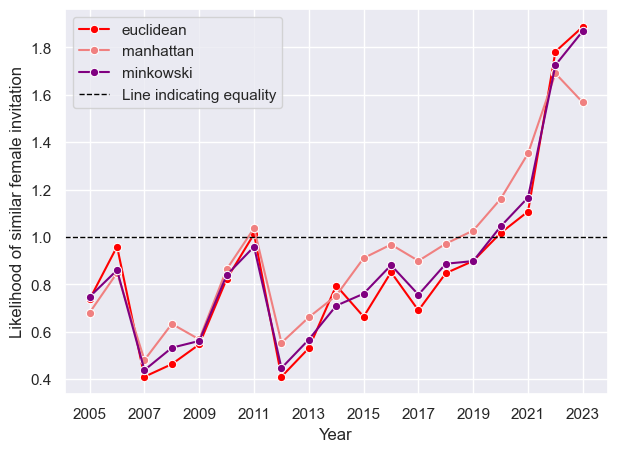

In [100]:
plotLikelihood([euclidean50Stats, k50, minkowski50Stats], ['red', 'lightcoral', 'purple'], False, 'Likelihood of similar female invitation', ['euclidean', 'manhattan', 'minkowski'], 'metricsKNN_50K')

### Varying q

In [101]:
#manhattan distance, K = 50, q varied
varyQ_df = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.1, 0.2, 0.4, 0.5, 0.6, 0.8, 0.9] , 1000, ['_F', '_M'])

100%|███████████████████████████████████████| 1/1 [11:26:51<00:00, 41211.33s/it]


In [102]:
varyQ_df.to_pickle("Files/Dataframes/manhattanLikelihood_varyQ.pkl")  

In [942]:
varyQ_stats = getStats_likelihood(varyQ_df, 'q')

In [943]:
qList = varyQ_stats.q.unique().tolist()
q01= varyQ_stats[varyQ_stats.q == 0.1]
q02= varyQ_stats[varyQ_stats.q == 0.2]
q04= varyQ_stats[varyQ_stats.q == 0.4]
q05= varyQ_stats[varyQ_stats.q == 0.5]
q06= varyQ_stats[varyQ_stats.q == 0.6]
q08= varyQ_stats[varyQ_stats.q == 0.8]
q09= varyQ_stats[varyQ_stats.q == 0.9]

In [944]:
colors = ['grey', 'firebrick', 'fuchsia', 'sandybrown', 'mediumslateblue', 'red', 'lightcoral']

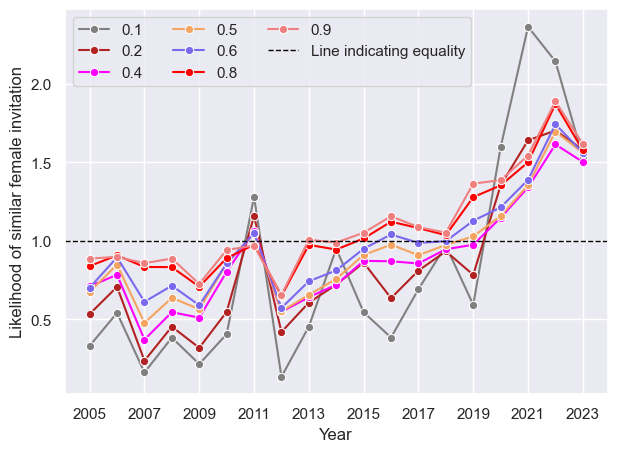

In [945]:
plotLikelihood([q01, q02, q04, q05, q06, q08, q09], colors, False, 'Likelihood of similar female invitation', qList, 'varyQ_KNN_manhattan')

### Piecewise function

In [946]:
finalLikelihood = q05[q05.Year == 2023].Avg_likelihood.values[0]
startLikelihood = q05[q05.Year <= 2013]
#avgLikelihood = startLikelihood[startLikelihood.Year != 2011]['Avg_likelihood'].mean()
avgLikelihood = startLikelihood['Avg_likelihood'].mean()

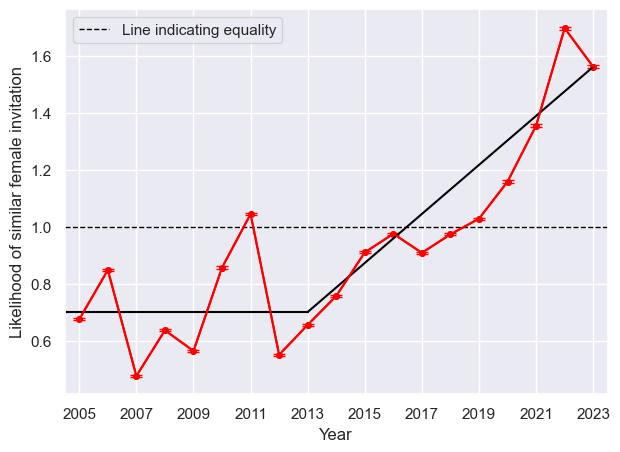

In [951]:
years = q05.Year.unique()
sns.lineplot(data = q05, x = 'Year', y = 'Avg_likelihood', marker = 'o', color = 'red')
plt.errorbar(x = q05.Year, y = q05.Avg_likelihood, yerr = q05.SEM_likelihood, color = 'red', capsize = 4)
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.xlim(2004.5,2023.5)
#plt.axhline(avgLikelihood, color = 'black', linewidth = 1)
plt.plot([2004.5, 2013], [avgLikelihood, avgLikelihood], color = 'black')
plt.plot([2013, 2023], [avgLikelihood,finalLikelihood], color = 'black')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.legend()
plt.ylabel('Likelihood of similar female invitation')
plt.show()

[2005.         2018.36215469 2023.        ]


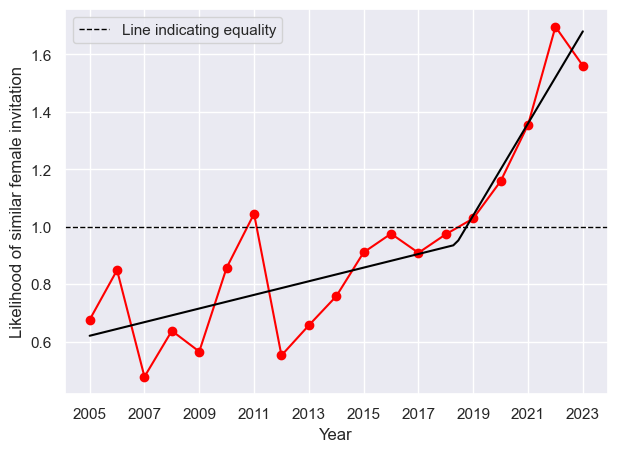

In [812]:
## fit piecewise
import pwlf
x = q05.Year.values
y = q05.Avg_likelihood.values

my_pwlf = pwlf.PiecewiseLinFit(x, y)
breaks = my_pwlf.fit(2)
print(breaks)


x_hat = np.linspace(x.min(), x.max(), 100)
y_hat = my_pwlf.predict(x_hat)

plt.figure()
plt.plot(x, y, '-o', color = 'red')
plt.plot(x_hat, y_hat, '-', color = 'black')
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.legend()
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.xlabel("Year")
plt.ylabel("Likelihood of similar female invitation")
plt.show()

### Filtering on seniority

In [124]:
#create seniority categories
binStart = [-1]
bins = np.arange(5, 35, 5).tolist()
bins.append(float("inf"))
binStart += bins
labels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']

seniorityCat_researchers = oneHot_researchers.copy()
seniorityCat_researchers['Seniority_cat'] = pd.cut(oneHot_researchers['Seniority'], bins = binStart, labels = labels)

#### Choosing Parameters 

In [126]:
#likelihood for different K
seniorityLikelihood5 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 5, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood10 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 10, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood15 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 15, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood20 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 20, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood25 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood30 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 30, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood35 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 35, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')

100%|██████████████████████████████████████████| 19/19 [41:48<00:00, 132.04s/it]


In [127]:
#get stats
seniorityLikelihood_stats5 = getStats_likelihood(seniorityLikelihood5, 'Seniority')
seniorityLikelihood_stats10 = getStats_likelihood(seniorityLikelihood10, 'Seniority')
seniorityLikelihood_stats15 = getStats_likelihood(seniorityLikelihood15, 'Seniority')
seniorityLikelihood_stats20 = getStats_likelihood(seniorityLikelihood20, 'Seniority')
seniorityLikelihood_stats25 = getStats_likelihood(seniorityLikelihood25, 'Seniority')
seniorityLikelihood_stats30 = getStats_likelihood(seniorityLikelihood30, 'Seniority')
seniorityLikelihood_stats35 = getStats_likelihood(seniorityLikelihood35, 'Seniority')

In [128]:
#set order 
seniorityLikelihood_stats5['Seniority'] = pd.Categorical(seniorityLikelihood_stats5['Seniority'],
                                   categories=['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30'],
                                   ordered=True)

In [221]:
colors = ['grey', 'firebrick', 'fuchsia', 'sandybrown', 'mediumslateblue', 'red', 'lightcoral']

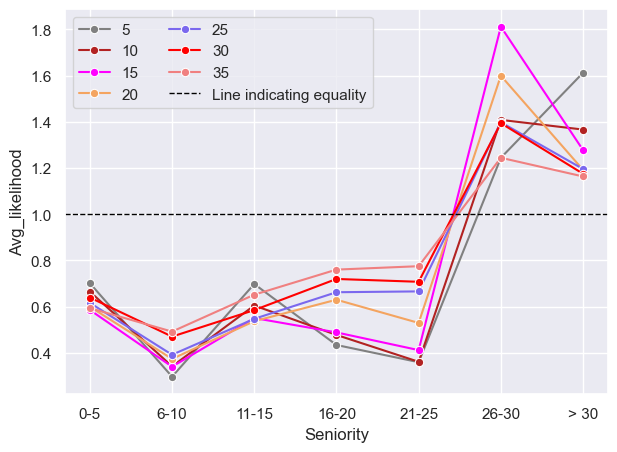

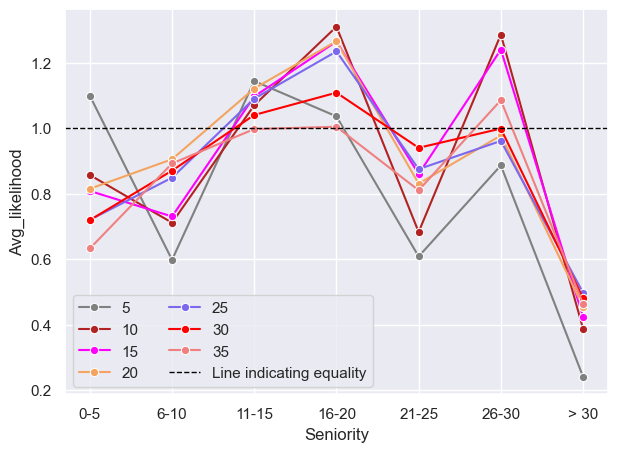

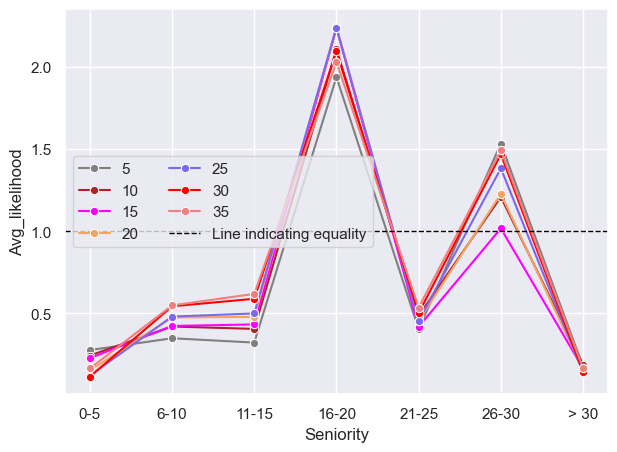

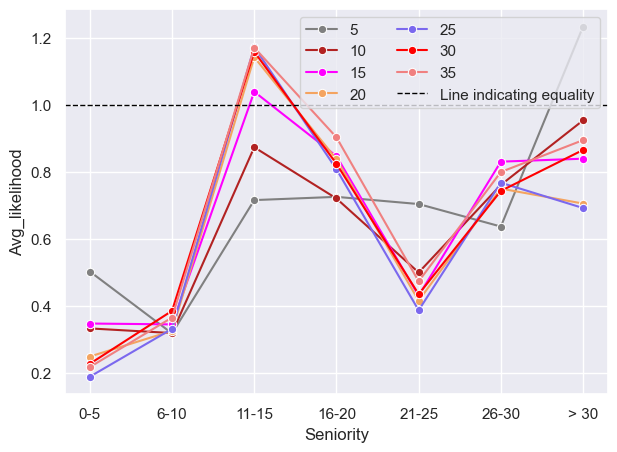

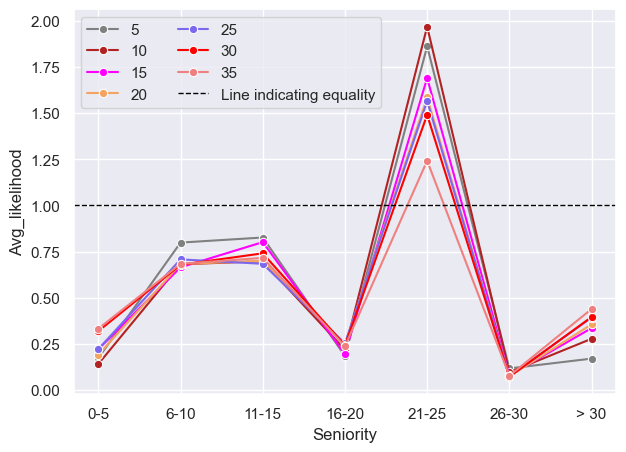

...

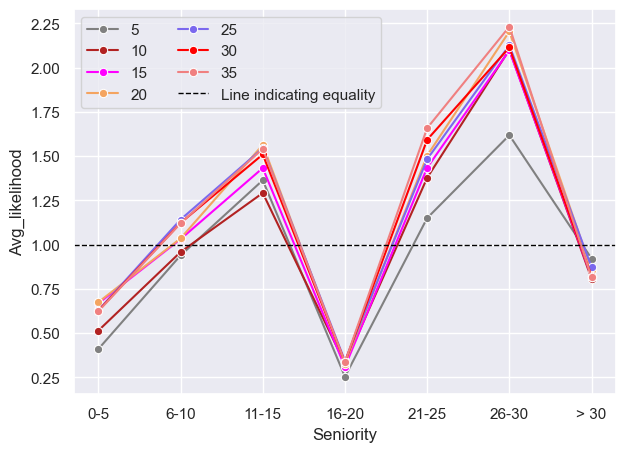

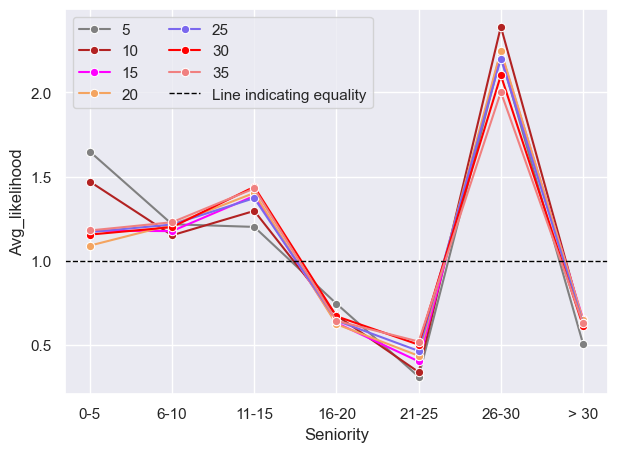

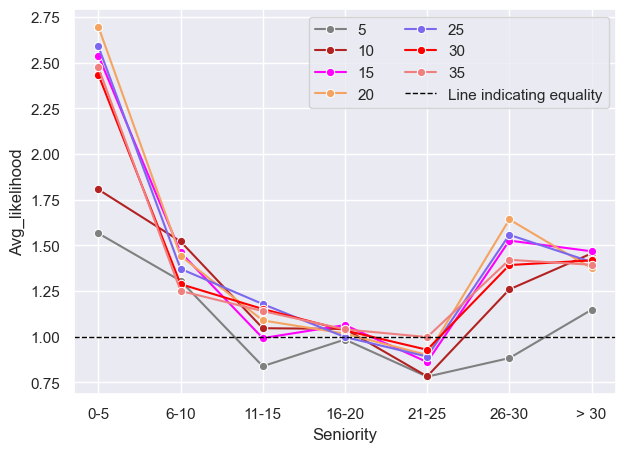

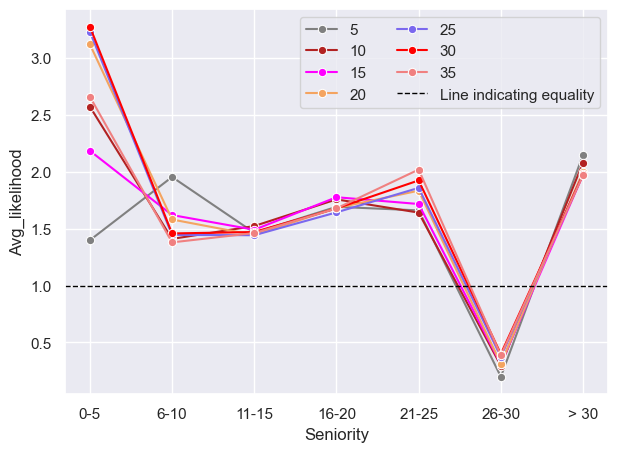

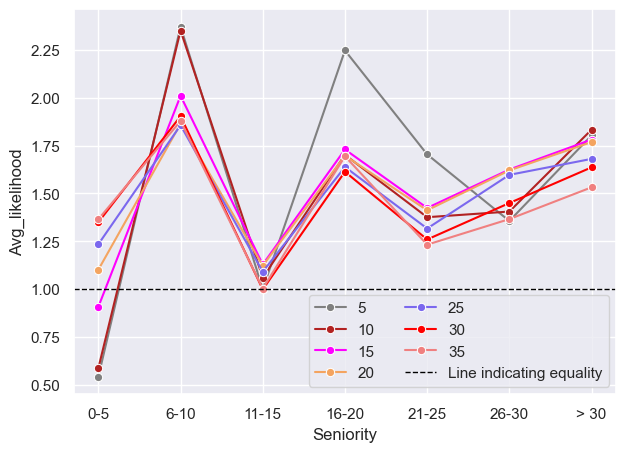

In [222]:
df_list = [seniorityLikelihood_stats5, seniorityLikelihood_stats10, seniorityLikelihood_stats15, seniorityLikelihood_stats20, seniorityLikelihood_stats25, seniorityLikelihood_stats30, seniorityLikelihood_stats35]
K_list = [5, 10, 15, 20, 25, 30, 35]
plotSeniority_varyParameters(df_list, K_list, colors, "seniorityLikelihoodF_varyK")

In [144]:
#different metrics
seniorityLikelihood_euclidean = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'euclidean', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood_minkowski = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'minkowski', 0.5, 1000, ['_F', '_M'], 'SessionType')

100%|██████████████████████████████████████████| 19/19 [41:45<00:00, 131.89s/it]


In [145]:
seniorityLikelihood_statsEuclidean = getStats_likelihood(seniorityLikelihood_euclidean, 'Seniority')
seniorityLikelihood_statsMinkowski = getStats_likelihood(seniorityLikelihood_minkowski, 'Seniority')

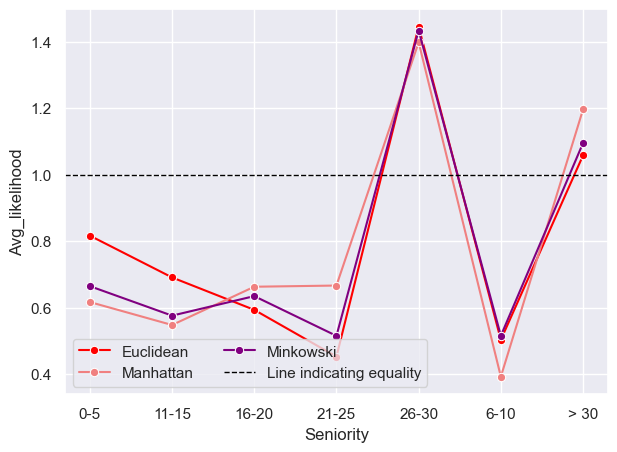

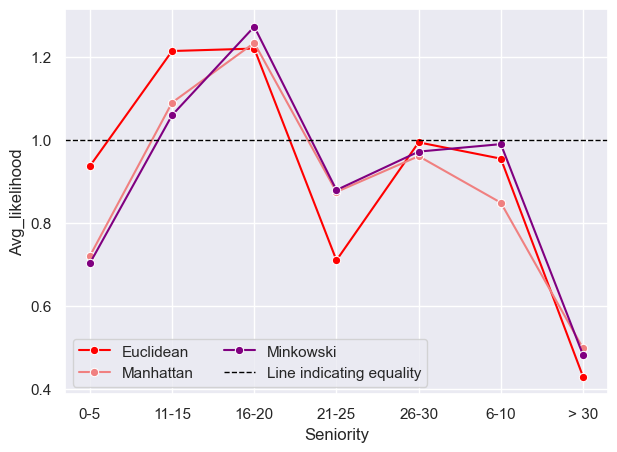

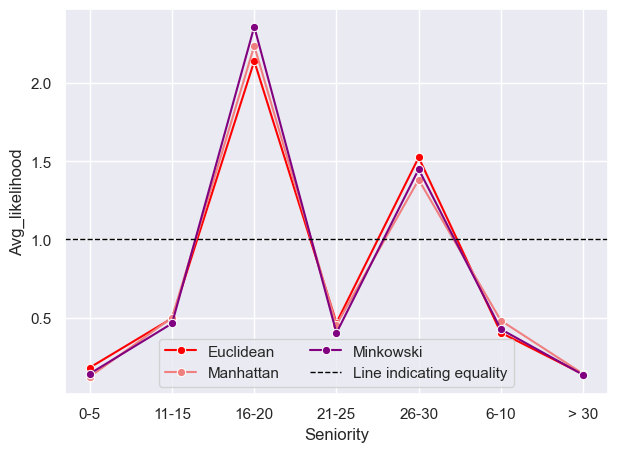

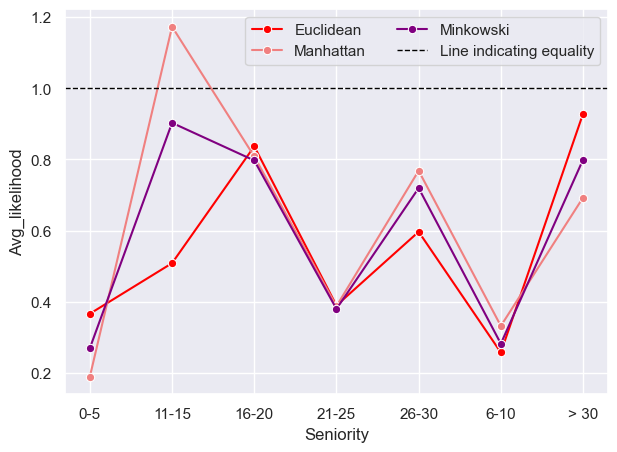

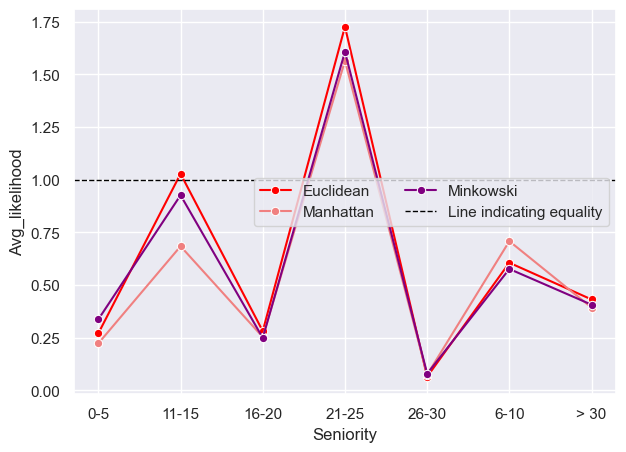

...

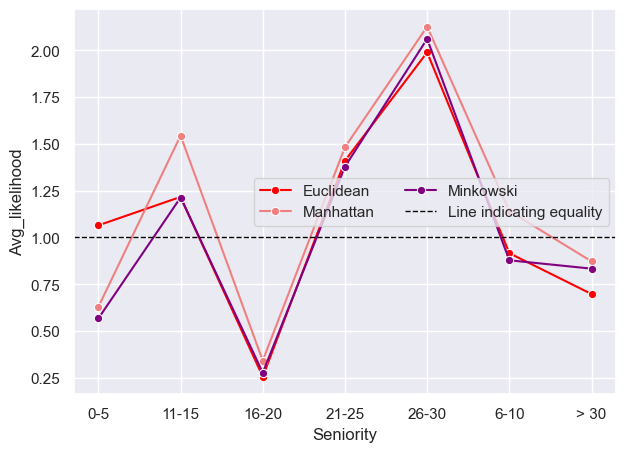

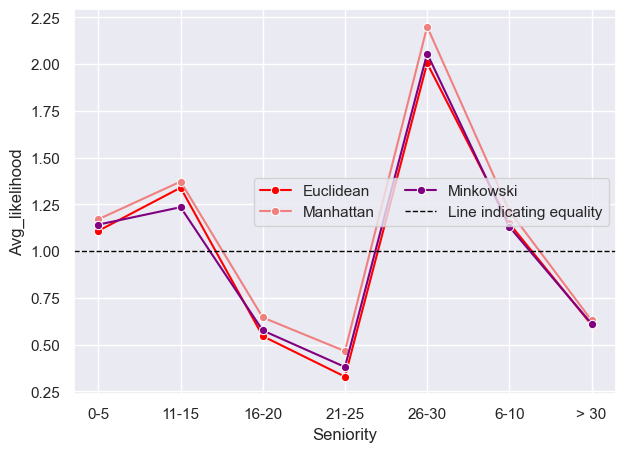

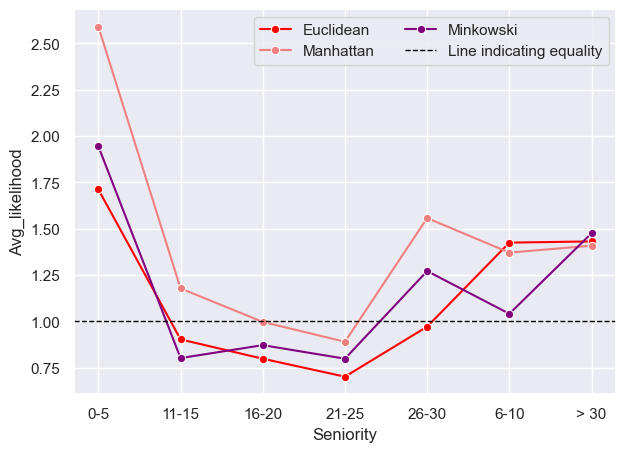

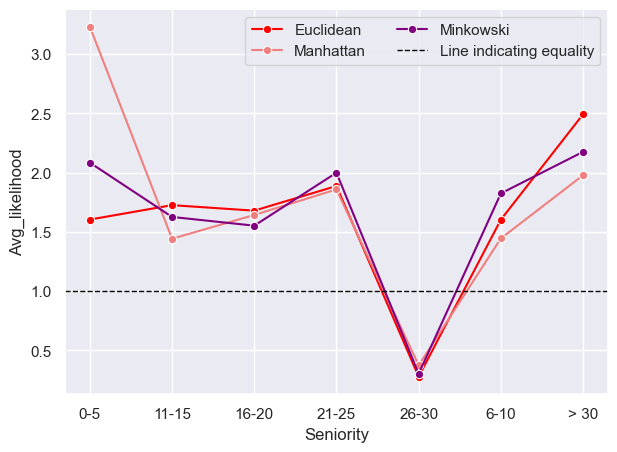

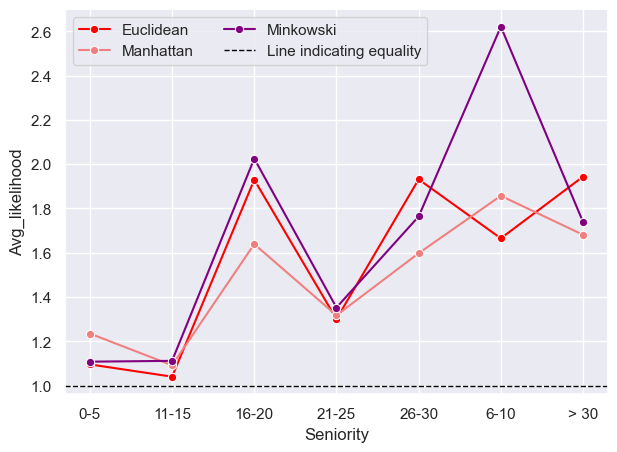

In [219]:
df_list = [seniorityLikelihood_statsEuclidean, seniorityLikelihood_stats25, seniorityLikelihood_statsMinkowski]
metricList  = ['Euclidean', 'Manhattan', 'Minkowski']
plotSeniority_varyParameters(df_list, metricList, ['red', 'lightcoral', 'purple'], "seniorityLikelihoodF_varyDist")

In [148]:
#likelihood for different q
seniorityLikelihood02 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.2, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood04 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.4, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood05 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood06 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.6, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood08 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.8, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood09 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.9, 1000, ['_F', '_M'], 'SessionType')

  0%|                                                    | 0/19 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/2957691842.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
100%|██████████████████████████████████████████| 19/19 [59:52<00:00, 189.09s/it]


In [160]:
seniorityLikelihood_stats02 = getStats_likelihood(seniorityLikelihood02, 'Seniority')
seniorityLikelihood_stats04 = getStats_likelihood(seniorityLikelihood04, 'Seniority')
seniorityLikelihood_stats05 = getStats_likelihood(seniorityLikelihood05, 'Seniority')
seniorityLikelihood_stats06 = getStats_likelihood(seniorityLikelihood06, 'Seniority')
seniorityLikelihood_stats08 = getStats_likelihood(seniorityLikelihood08, 'Seniority')
seniorityLikelihood_stats09 = getStats_likelihood(seniorityLikelihood09, 'Seniority')

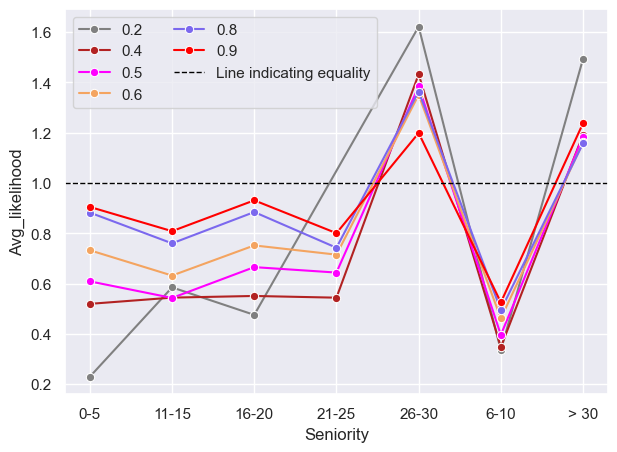

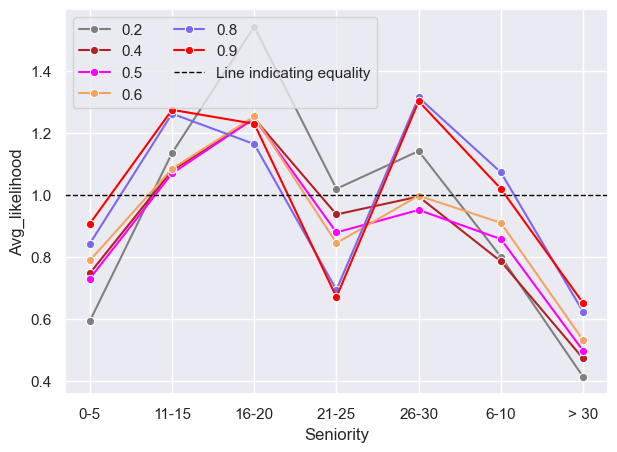

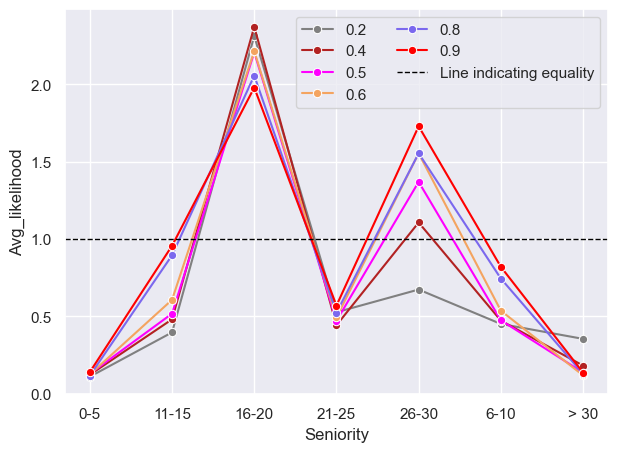

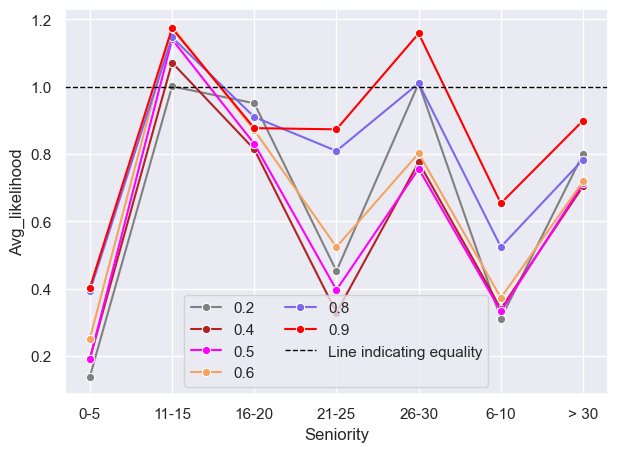

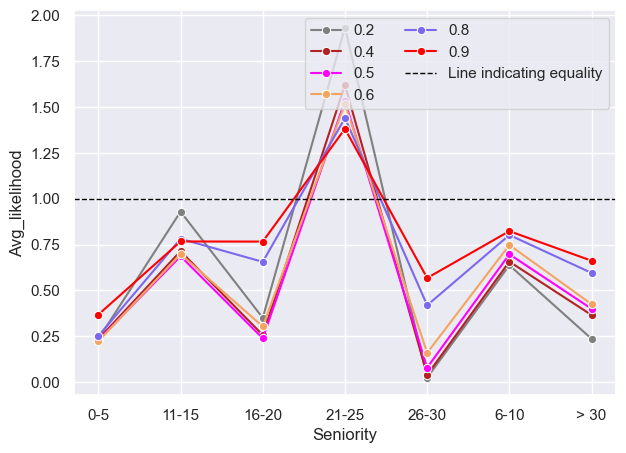

...

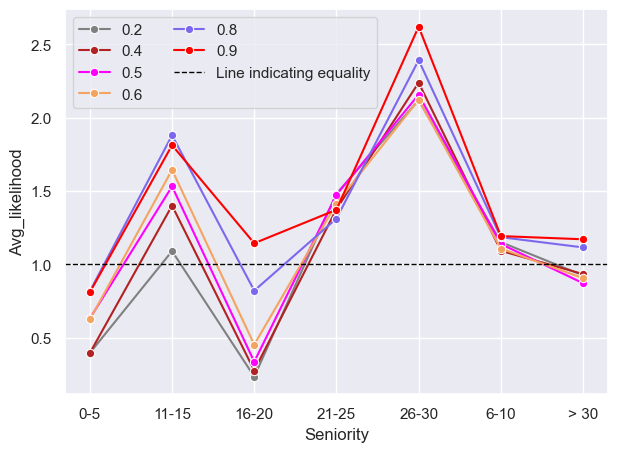

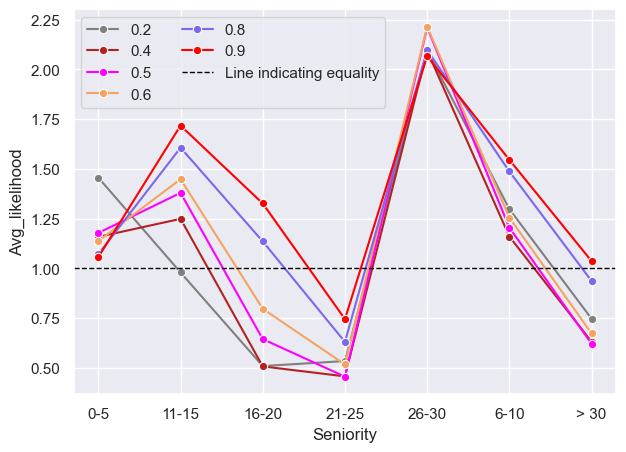

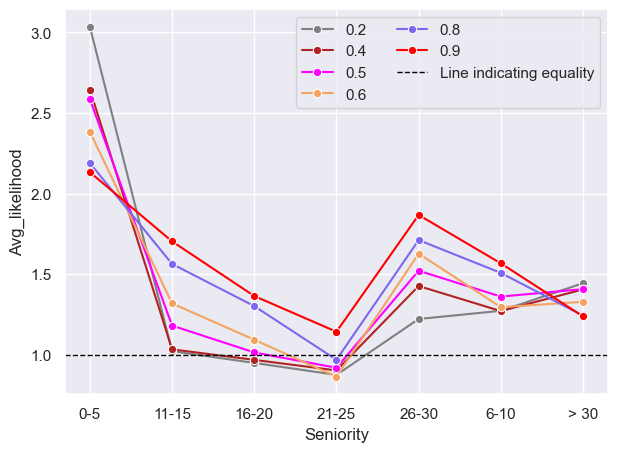

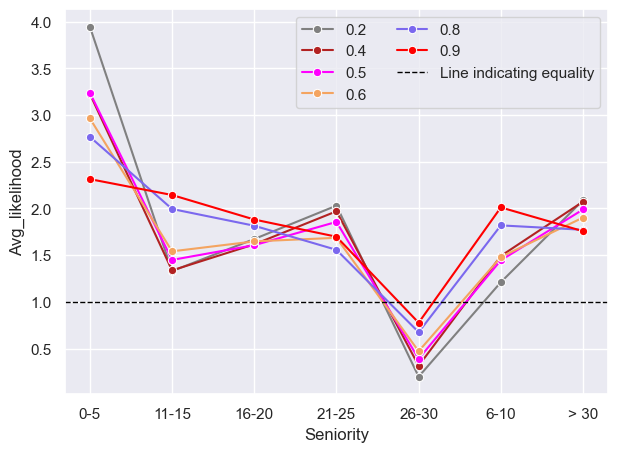

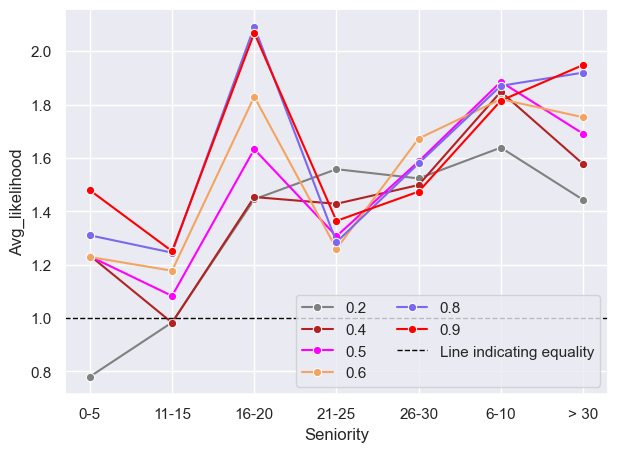

In [223]:
df_list = [seniorityLikelihood_stats02, seniorityLikelihood_stats04,  seniorityLikelihood_stats05, seniorityLikelihood_stats06, seniorityLikelihood_stats08, seniorityLikelihood_stats09]
q_list  = ['0.2', '0.4', '0.5', '0.6', '0.8', '0.9']
plotSeniority_varyParameters(df_list, q_list, colors, "seniorityLikelihoodF_varyQ")

#### Heatmap of likelihood

In [167]:
seniorityLikelihood05.to_pickle("Files/Dataframes/seniorityLikelihood.pkl")  

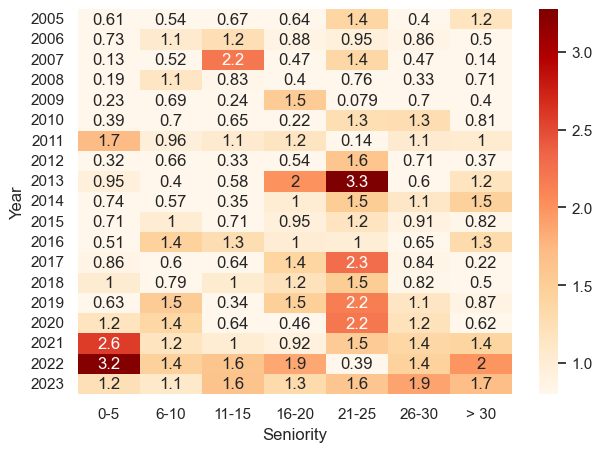

In [445]:
avgLikelihood_heatmap(seniorityLikelihood_stats05, 'likelihoodHeatmap_females.png', 'OrRd', 'Avg_likelihood', 0.8)

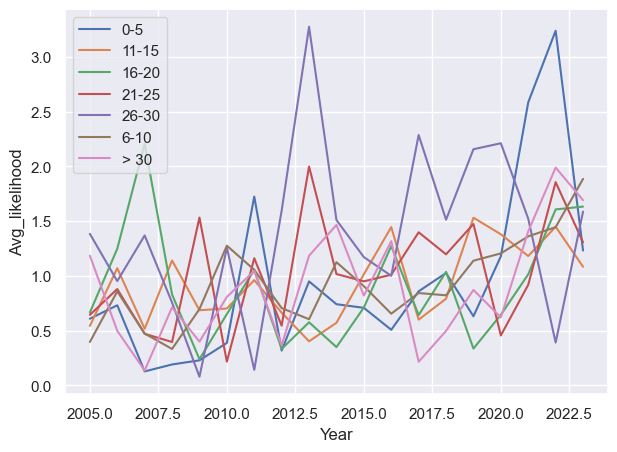

In [744]:
#plot relative likelihood
seniorityGroups = seniorityLikelihood_stats05.Seniority.unique()
for i in seniorityGroups:
    seniority_df = seniorityLikelihood_stats05[seniorityLikelihood_stats05.Seniority == i]
    sns.lineplot(data = seniority_df, x = 'Year', y = 'Avg_likelihood', label = i)

In [178]:
seniorityLikelihood_stats['Seniority'] = seniorityLikelihood_stats['Seniority'].replace(
    {'0-5': 0, '6-10': 1, '11-15': 2, '16-20': 3, '21-25': 4, '26-30': 5, '> 30': 6})

In [179]:
seniorityLikelihood_stats.corr()

,Seniority,Year,Avg_likelihood,STD_likelihood,SEM_likelihood
Seniority,1.000000e+00,-1.743020e-14,0.104769,0.205882,0.205882
Year,-1.743020e-14,1.000000e+00,0.408540,0.130278,0.130278
Avg_likelihood,1.047693e-01,4.085402e-01,1.000000,0.886312,0.886312
STD_likelihood,2.058817e-01,1.302777e-01,0.886312,1.000000,1.000000
SEM_likelihood,2.058817e-01,1.302777e-01,0.886312,1.000000,1.000000


### Similarity for males

Now, the evolution of likelihood of males similar to females being invited, will be calculated. 

#### Choosing parameters

In [193]:
#vary distance metric (K = 50 as starting point)
euclideanLikelihood_M = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Male', 'Female'], 'euclidean', [0.5], 1000, ['_M', '_F'])
manhattanLikelihood_M = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])
minkowskiLikelihood_M = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Male', 'Female'], 'minkowski', [0.5], 1000, ['_M', '_F'])

100%|████████████████████████████████████████████| 1/1 [11:39<00:00, 699.76s/it]


In [195]:
euclideanStats_M = getStats_likelihood(euclideanLikelihood_M , 'K')
manhattanStats_M = getStats_likelihood(manhattanLikelihood_M, 'K')
minkowskiStats_M = getStats_likelihood(minkowskiLikelihood_M, 'K')

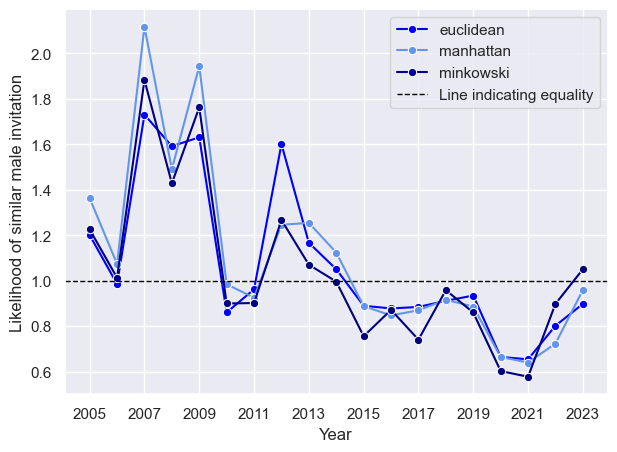

In [209]:
plotLikelihodod([euclideanStats_M, manhattanStats_M, minkowskiStats_M], ['blue', 'cornflowerblue', 'navy'], False, 'Likelihood of similar male invitation', ['euclidean', 'manhattan', 'minkowski'], 'metricsKNN_50K_males')

In [371]:
varyK_df_males = likelihoodEvolution(oneHot_researchers, allCols, [2, 5, 10, 20, 40, 50, 80, 100], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])

100%|██████████████████████████████████████████| 8/8 [1:38:09<00:00, 736.23s/it]


In [372]:
#save df as pickle
varyK_df_males.to_pickle("Files/Dataframes/likelihood_varyK_males.pkl")  

In [373]:
varyK_Stats_males = getStats_likelihood(varyK_df_males, 'K')

In [408]:
kList = varyK_Stats_males.K.unique().tolist()
k2 = varyK_Stats_males[varyK_Stats_males.K == 2]
k5 = varyK_Stats_males[varyK_Stats_males.K == 5]
k10 = varyK_Stats_males[varyK_Stats_males.K == 10]
k20 = varyK_Stats_males[varyK_Stats_males.K == 20]
k40 = varyK_Stats_males[varyK_Stats_males.K == 40]
k50 = varyK_Stats_males[varyK_Stats_males.K == 50]
k80 = varyK_Stats_males[varyK_Stats_males.K == 80]
k100 = varyK_Stats_males[varyK_Stats_males.K == 100]

In [398]:
colors = ['grey', 'royalblue', 'navy', 'sandybrown', 'darkgreen', 'mediumslateblue', 'blue', 'deepskyblue']

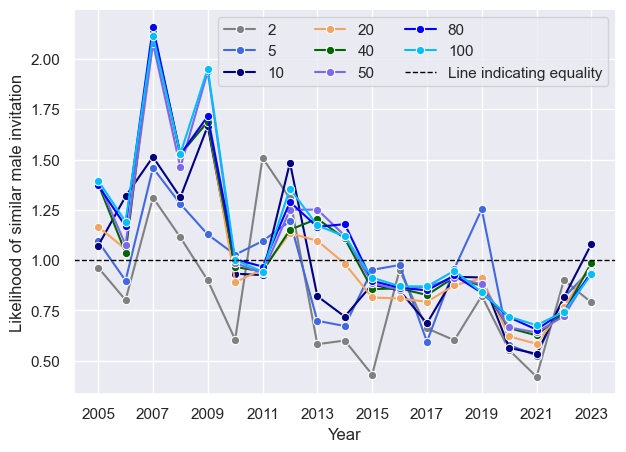

In [399]:
plotLikelihood([k2, k5 ,k10, k20, k40, k50, k80, k100], colors, False, 'Likelihood of similar male invitation', kList, 'varyK_KNN_manhattanMales')

In [416]:
#manhattan distance, K = 50, q varied
varyQ_df_males = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.2, 0.4, 0.5, 0.6, 0.8, 0.9] , 1000, ['_M', '_F'])

100%|████████████████████████████████████████| 1/1 [2:54:54<00:00, 10494.23s/it]


In [417]:
varyQ_df_males.to_pickle("Files/Dataframes/manhattanLikelihood_varyQMales.pkl")  

In [418]:
varyQ_stats_males = getStats_likelihood(varyQ_df_males, 'q')

In [423]:
qList = varyQ_stats_males.q.unique().tolist()
q02= varyQ_stats_males[varyQ_stats_males.q == 0.2]
q04= varyQ_stats_males[varyQ_stats_males.q == 0.4]
q05= varyQ_stats_males[varyQ_stats_males.q == 0.5]
q06= varyQ_stats_males[varyQ_stats_males.q == 0.6]
q08= varyQ_stats_males[varyQ_stats_males.q == 0.8]
q09= varyQ_stats_males[varyQ_stats_males.q == 0.9]

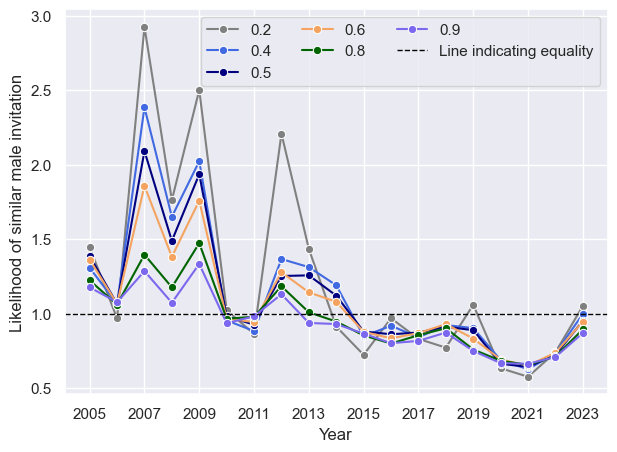

In [431]:
plotLikelihood([q02, q04, q05, q06, q08, q09], colors, False, 'Likelihood of similar male invitation', qList, 'varyQ_KNN_manhattan_males')

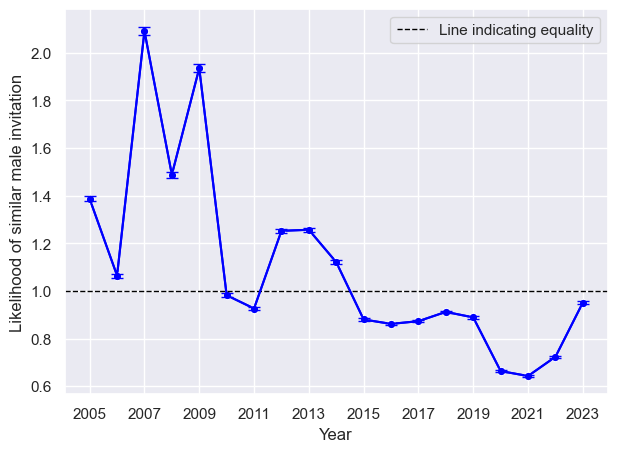

In [432]:
plotLikelihood([q05], ['blue'], True, 'Likelihood of similar male invitation', [''], 'finalLikelihood_male')

In [454]:
#relative likelihood for females(distance metric = manhattan, K = 50, q = 0.5)
k50_females = varyK_Stats[varyK_Stats.K == 50]

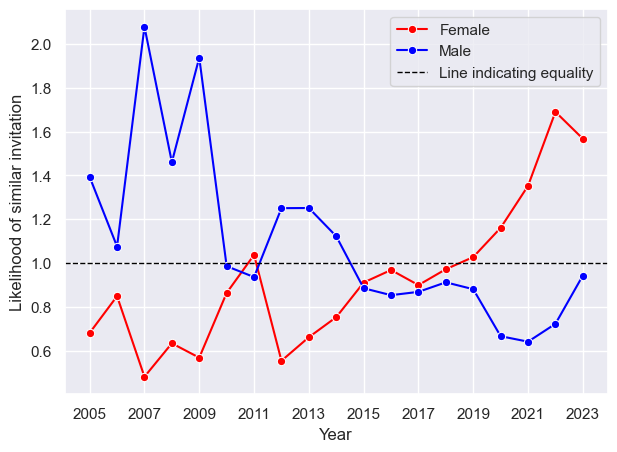

In [456]:
#plot females and males
plotLikelihood([k50_females, k50], ['red', 'blue'], False, 'Likelihood of similar invitation', ['Female', 'Male'], 'likelihood_maleVSfemale')

### Filtering on seniority

In [905]:
#ratio of females with at least one invited male(similar to the female)
matchRatio_df = matchRatio_wSeniority(seniorityCat_researchers, allCols,  ['Male', 'Female'], 25, 'manhattan', 0.5, 'SessionType')

100%|███████████████████████████████████████████| 19/19 [00:05<00:00,  3.35it/s]


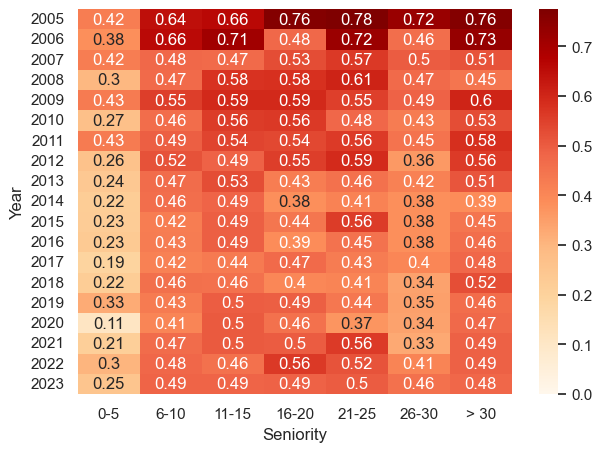

In [970]:
avgLikelihood_heatmap(matchRatio_df, "maleInvMatches", "OrRd", "MatchRatio", 0)

In [974]:
oneHot_researchers[['SearchName', 'Year', 'Seniority', 'CumulativePaperCount', 'Productivity']]

,SearchName,Year,Seniority,CumulativePaperCount,Productivity
0,adam sirois,2011,5,26,5.200000
1,benjamin nehls,2006,2,6,3.000000
2,dennis livesay,2008,9,26,2.888889
3,feras alzubi,2007,0,0,0.000000
4,gordon berman,2008,3,4,1.333333
...,...,...,...,...,...
281378,øyvind borck,2011,5,19,3.800000
281379,øyvind johansen,2019,48,2,0.041667
281380,øyvind torgersrud,2023,13,4,0.307692
281381,łukasz mioduszewski,2022,8,11,1.375000


### Likelihood with different features

In [457]:
#allCols
removeSeniority = np.delete(allCols, [-3])
removePaperCount = np.delete(allCols, [-2])
removeProductivity = np.delete(allCols, [-1])
removeUnits = allCols[-3:]

#### Females

In [458]:
#calculate likelihood but removing one feature
seniorityRemoved_likelihood = likelihoodEvolution_changeFeatures(oneHot_researchers, removeSeniority, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
paperCountRemoved_likelihood = likelihoodEvolution_changeFeatures(oneHot_researchers, removePaperCount, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
productivityRemoved_likelihood = likelihoodEvolution_changeFeatures(oneHot_researchers, removeProductivity, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
unitsRemoved_likelihood = likelihoodEvolution_changeFeatures(oneHot_researchers, removeUnits, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])

100%|██████████████████████████████████████████| 19/19 [52:59<00:00, 167.35s/it]


In [459]:
#save results
seniorityRemoved_likelihood.to_pickle("Files/Dataframes/likelihood_seniorityRemoved.pkl")  
paperCountRemoved_likelihood.to_pickle("Files/Dataframes/likelihood_papercountRemoved.pkl")  
productivityRemoved_likelihood.to_pickle("Files/Dataframes/likelihood_productivityRemoved.pkl")  
unitsRemoved_likelihood.to_pickle("Files/Dataframes/likelihood_unitsRemoved.pkl")  

In [460]:
#get stats of results
seniorityRemovedStats = getStats_likelihood(seniorityRemoved_likelihood, 'K')
paperCountRemovedStats = getStats_likelihood(paperCountRemoved_likelihood, 'K')
productivityRemovedStats = getStats_likelihood(productivityRemoved_likelihood, 'K')
unitsRemovedStats = getStats_likelihood(unitsRemoved_likelihood, 'K')

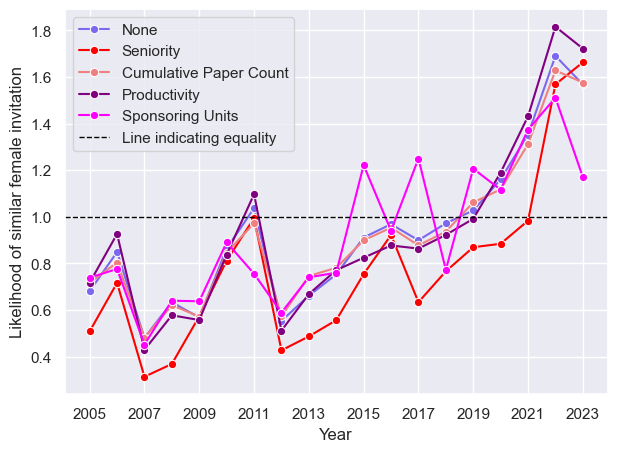

In [813]:
colors = ['mediumslateblue', 'red', 'lightcoral', 'purple', 'fuchsia']
plotLikelihood([k50_females, seniorityRemovedStats, paperCountRemovedStats, productivityRemovedStats, unitsRemovedStats], colors, False, 'Likelihood of similar female invitation', ['None', 'Seniority', 'Cumulative Paper Count', 'Productivity', 'Sponsoring Units'], 'femaleLikelihood_featuresRemoved')

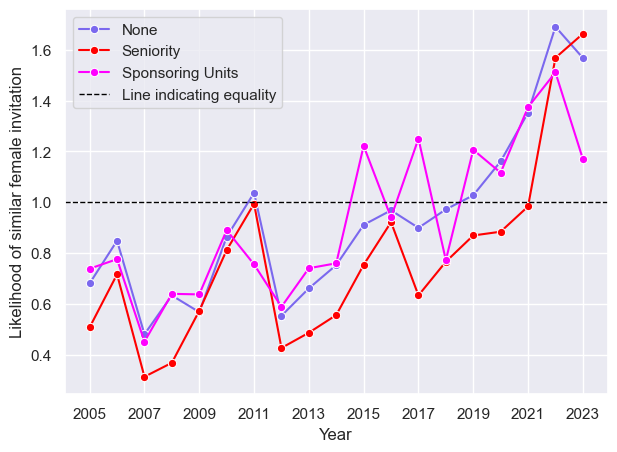

In [814]:
colors = ['mediumslateblue', 'red', 'fuchsia']
plotLikelihood([k50_females, seniorityRemovedStats, unitsRemovedStats], colors, False, 'Likelihood of similar female invitation', ['None', 'Seniority', 'Sponsoring Units'], 'femaleLikelihood_featuresRemoved_selected')

#### Males

In [462]:
#calculate likelihood but removing one feature
seniorityRemoved_likelihood_male = likelihoodEvolution_changeFeatures(oneHot_researchers, removeSeniority, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])
paperCountRemoved_likelihood_male = likelihoodEvolution_changeFeatures(oneHot_researchers, removePaperCount, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])
productivityRemoved_likelihood_male = likelihoodEvolution_changeFeatures(oneHot_researchers, removeProductivity, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])
unitsRemoved_likelihood_male = likelihoodEvolution_changeFeatures(oneHot_researchers, removeUnits, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])

100%|███████████████████████████████████████████| 19/19 [10:47<00:00, 34.09s/it]


In [463]:
#save results
seniorityRemoved_likelihood_male.to_pickle("Files/Dataframes/likelihood_seniorityRemoved_male.pkl")  
paperCountRemoved_likelihood_male.to_pickle("Files/Dataframes/likelihood_papercountRemoved_male.pkl")  
productivityRemoved_likelihood_male.to_pickle("Files/Dataframes/likelihood_productivityRemoved_male.pkl")  
unitsRemoved_likelihood_male.to_pickle("Files/Dataframes/likelihood_unitsRemoved_male.pkl")  

In [464]:
#get stats of results
seniorityRemovedStats_males = getStats_likelihood(seniorityRemoved_likelihood_male, 'K')
paperCountRemovedStats_males = getStats_likelihood(paperCountRemoved_likelihood_male, 'K')
productivityRemovedStats_males = getStats_likelihood(productivityRemoved_likelihood_male, 'K')
unitsRemovedStats_males = getStats_likelihood(unitsRemoved_likelihood_male, 'K')

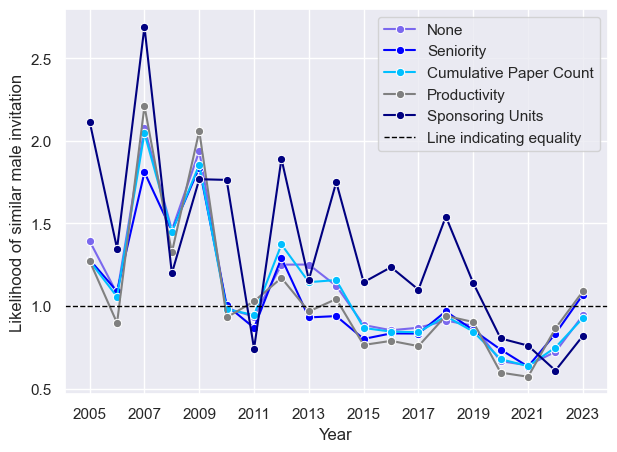

In [815]:
colors = ['mediumslateblue', 'blue', 'deepskyblue', 'grey', 'navy']
plotLikelihood([k50, seniorityRemovedStats_males, paperCountRemovedStats_males, productivityRemovedStats_males, unitsRemovedStats_males], colors, False, 'Likelihood of similar male invitation', ['None', 'Seniority', 'Cumulative Paper Count', 'Productivity', 'Sponsoring Units'], 'maleLikelihood_featuresRemoved')

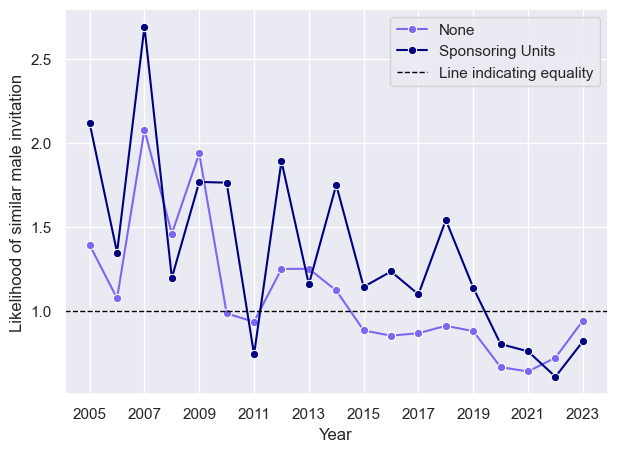

In [816]:
colors = ['mediumslateblue', 'navy']
plotLikelihood([k50, unitsRemovedStats_males], colors, False, 'Likelihood of similar male invitation', ['None', 'Sponsoring Units'], 'maleLikelihood_featuresRemoved_selected')

### Sponsoring units

Code below calculates the relative likelihood for each sponsoring unit. This is done by selecting only those with that sponsoring unit. We still use the other ones to calculate the distance, but this is to only plot the likelihood for people with that sponsoring unit. 

The relative likelihood is exactly the same, it is just filtered on sponsoring unit as well

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [02:35<00:00, 155.70s/it]

100%|████████████████████████████████████████████| 1/1 [02:35<00:00, 155.70s/it]


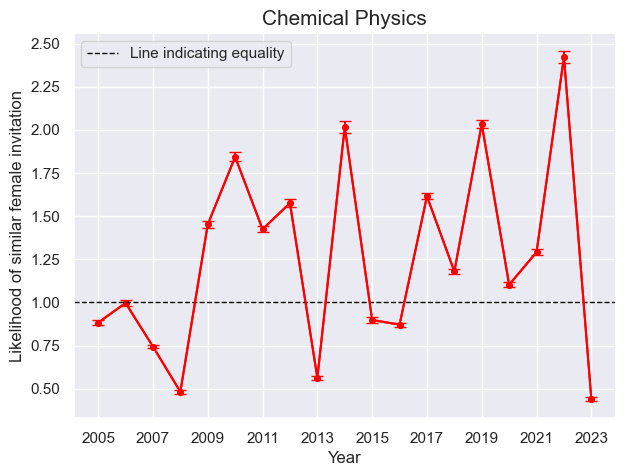

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [09:25<00:00, 565.81s/it]

100%|████████████████████████████████████████████| 1/1 [09:25<00:00, 565.81s/it]


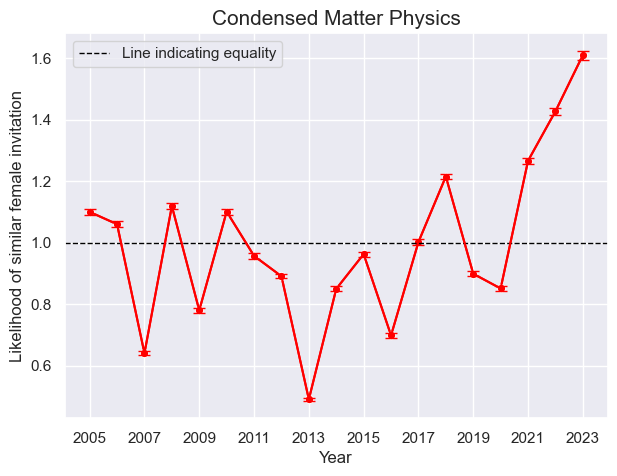

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [04:48<00:00, 288.99s/it]

100%|████████████████████████████████████████████| 1/1 [04:48<00:00, 288.99s/it]


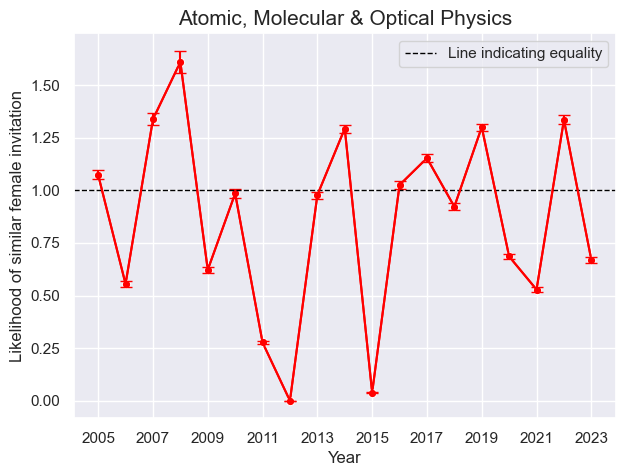

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [05:36<00:00, 337.00s/it]

100%|████████████████████████████████████████████| 1/1 [05:37<00:00, 337.00s/it]


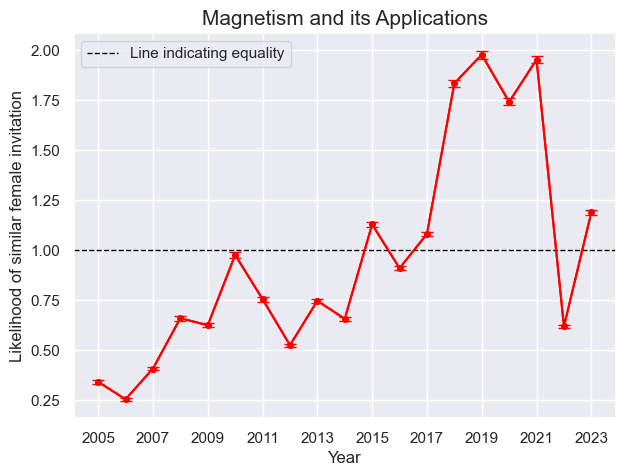

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [03:48<00:00, 228.74s/it]

100%|████████████████████████████████████████████| 1/1 [03:48<00:00, 228.74s/it]


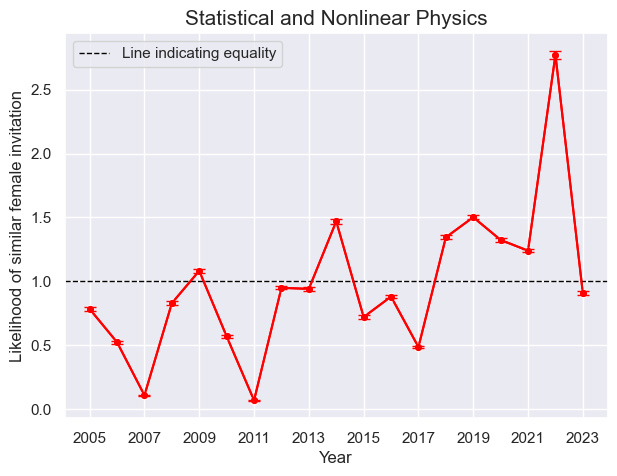

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered 

DFD



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|███████████████████████████████████████████| 1/1 [22:29<00:00, 1349.24s/it]

100%|███████████████████████████████████████████| 1/1 [22:29<00:00, 1349.24s/it]


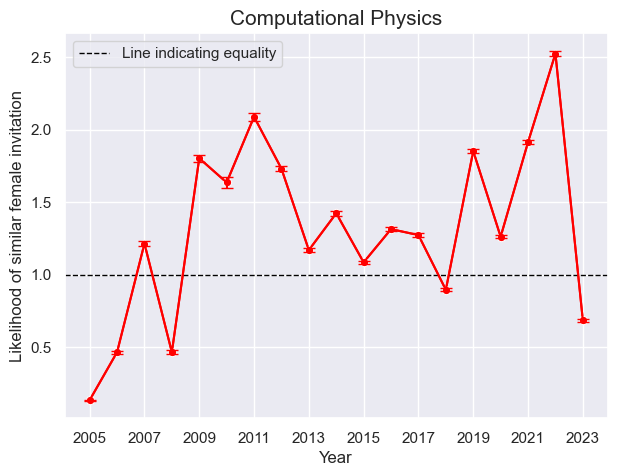

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [03:10<00:00, 190.92s/it]

100%|████████████████████████████████████████████| 1/1 [03:10<00:00, 190.92s/it]


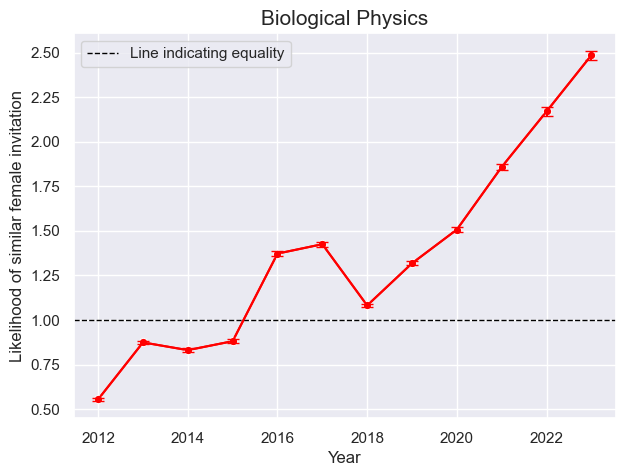

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [03:49<00:00, 229.41s/it]

100%|████████████████████████████████████████████| 1/1 [03:49<00:00, 229.41s/it]


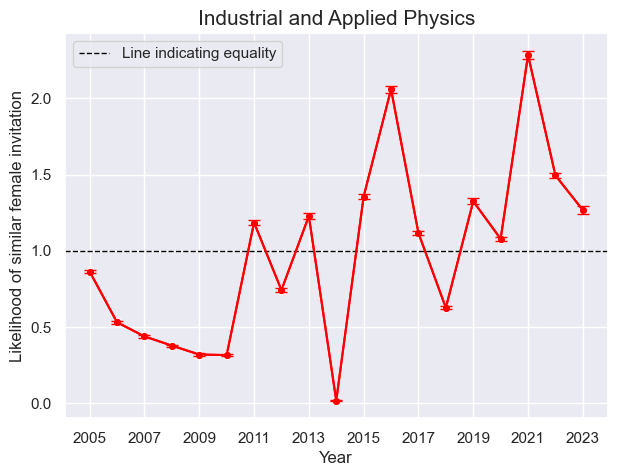

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:30<00:00, 30.80s/it]

100%|█████████████████████████████████████████████| 1/1 [00:30<00:00, 30.80s/it]


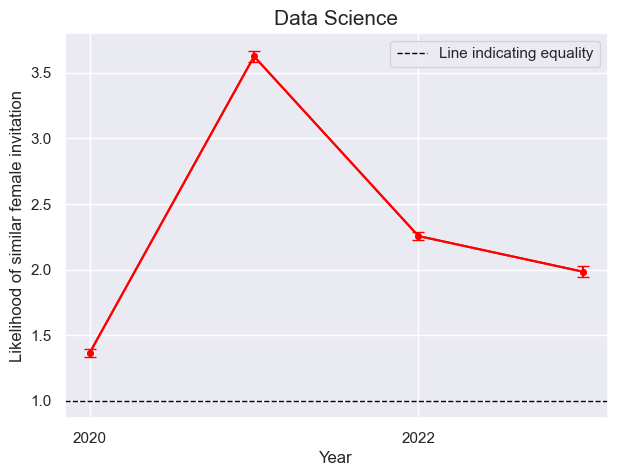

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [01:24<00:00, 84.57s/it]

100%|█████████████████████████████████████████████| 1/1 [01:24<00:00, 84.57s/it]


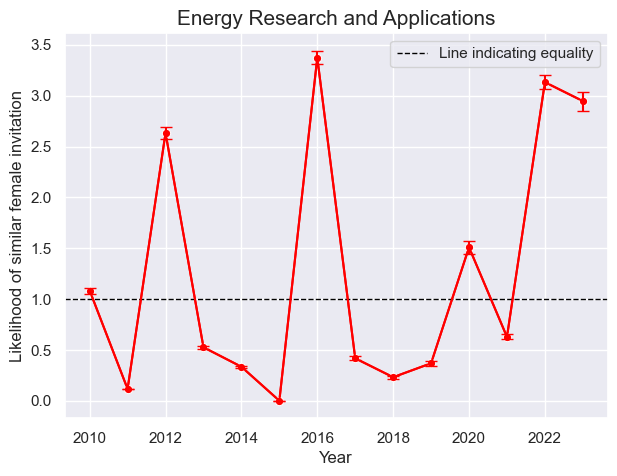

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [07:05<00:00, 425.79s/it]

100%|████████████████████████████████████████████| 1/1 [07:05<00:00, 425.79s/it]


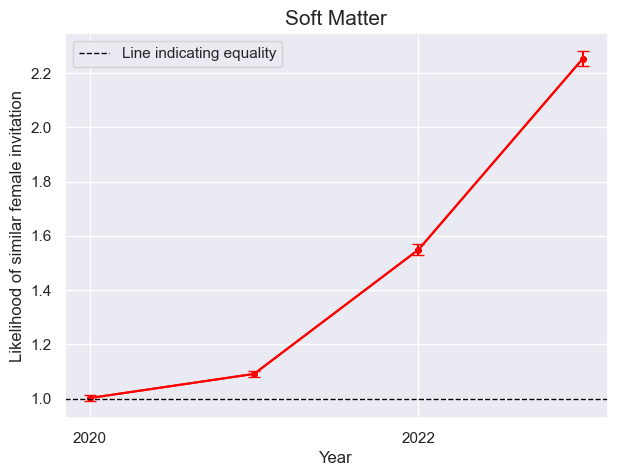

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered 

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/3166288494.py:20: RuntimeWarning: divide by z

GIMS



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|███████████████████████████████████████████| 1/1 [20:56<00:00, 1256.03s/it]

100%|███████████████████████████████████████████| 1/1 [20:56<00:00, 1256.03s/it]


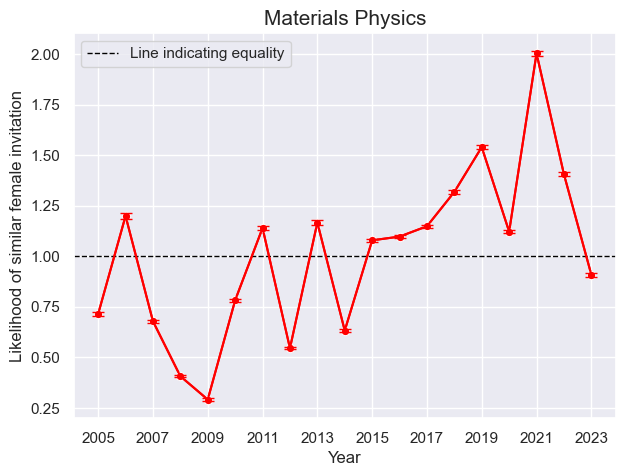

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [04:33<00:00, 273.30s/it]

100%|████████████████████████████████████████████| 1/1 [04:33<00:00, 273.31s/it]


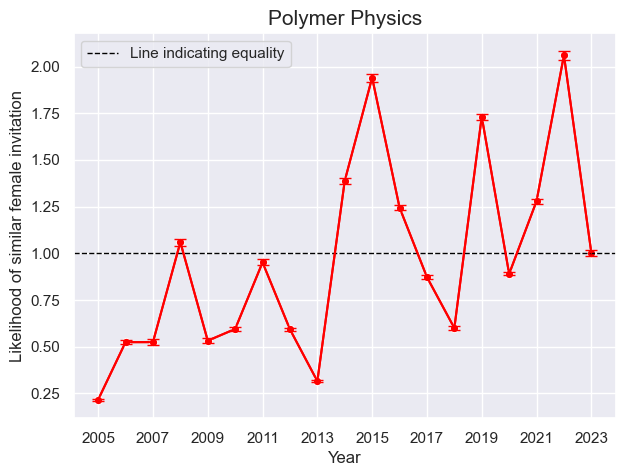

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [02:29<00:00, 149.42s/it]

100%|████████████████████████████████████████████| 1/1 [02:29<00:00, 149.43s/it]


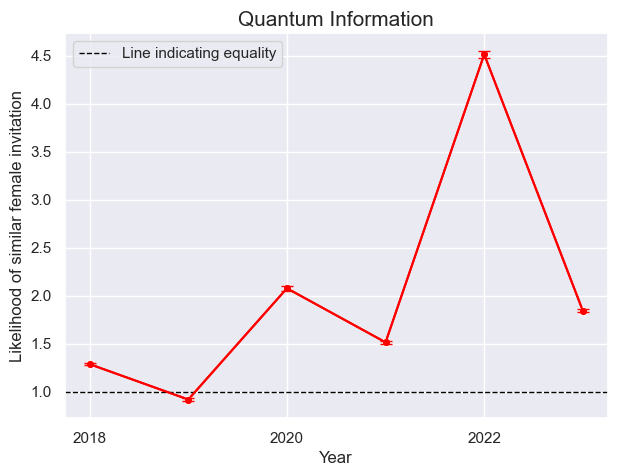

100%|████████████████████████████████████████| 29/29 [1:36:35<00:00, 199.83s/it]


In [1007]:
#relative likelihood for each sponsoring unit for females
sponsoringUnits = oneHot_researchers.columns[7:].tolist()
likelihoodStats_sponsoringUnits = relativeLikelihood_sponsoringUnits(sponsoringUnits, oneHot_researchers, 'Female', allCols, ['Female', 'Male'], ['_F', '_M'], 'red', 'Likelihood of similar female invitation', sponsorDict)

In [1008]:
#save likelihoodStats_sponsoringUnits as pickle
likelihoodStats_sponsoringUnits.to_pickle("Files/Dataframes/sponsoringUnitsLikelihood.pkl")  

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered 

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

DCP



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [02:49<00:00, 169.69s/it]

100%|████████████████████████████████████████████| 1/1 [02:49<00:00, 169.69s/it]


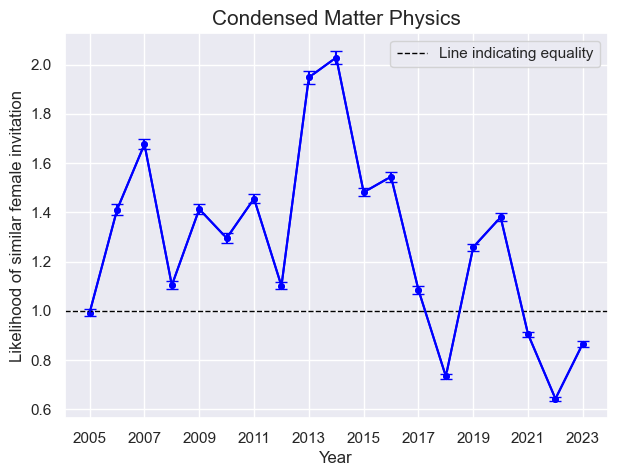

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


100%|█████████████████████████████████████████████| 1/1 [01:14<00:00, 74.09s/it]

 17%|███████▌                                    | 5/29 [05:25<29:24, 73.51s/it]

DAMOP



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

GMAG



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

GSNP



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0



 38%|████████████████▎                          | 11/29 [10:30<13:56, 46.49s/it]

DFD



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


100%|████████████████████████████████████████████| 1/1 [13:04<00:00, 784.21s/it]

 45%|██████████████████▊                       | 13/29 [23:34<41:13, 154.62s/it]

DCOMP



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [01:37<00:00, 97.62s/it]

100%|█████████████████████████████████████████████| 1/1 [01:37<00:00, 97.62s/it]


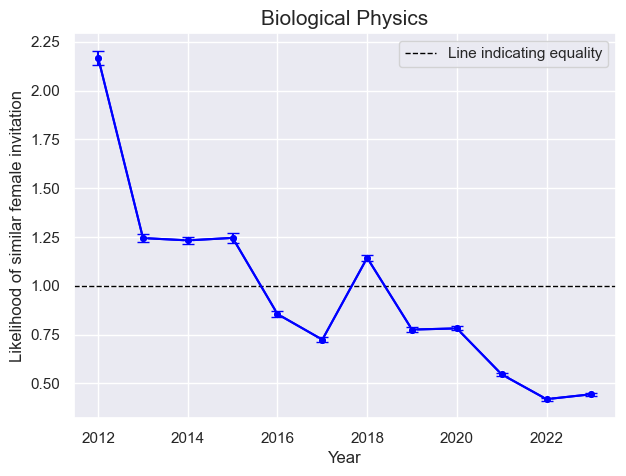

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


100%|████████████████████████████████████████████| 1/1 [01:45<00:00, 105.94s/it]

 62%|██████████████████████████▋                | 18/29 [26:58<16:02, 87.49s/it]

FIAP



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:19<00:00, 19.82s/it]

100%|█████████████████████████████████████████████| 1/1 [00:19<00:00, 19.83s/it]


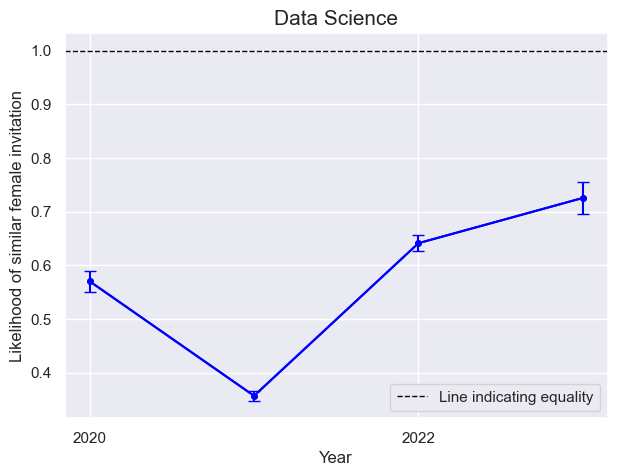

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


100%|█████████████████████████████████████████████| 1/1 [01:05<00:00, 65.12s/it]

 72%|███████████████████████████████▏           | 21/29 [28:24<08:48, 66.06s/it]

GERA



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:38<00:00, 38.96s/it]

100%|█████████████████████████████████████████████| 1/1 [00:38<00:00, 38.96s/it]


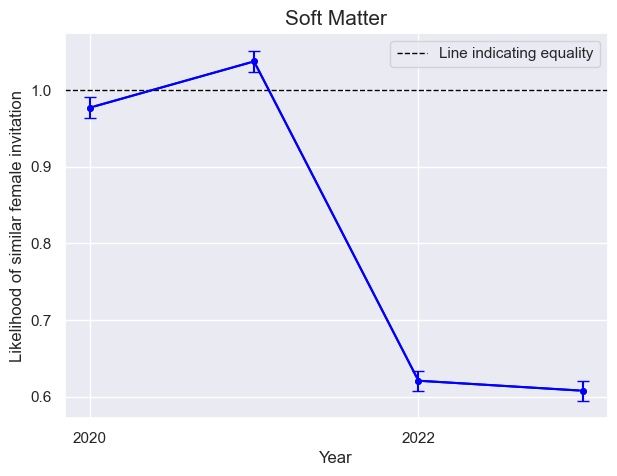

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered 

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0




100%|█████████████████████████████████████████████| 1/1 [01:26<00:00, 86.78s/it]

 86%|█████████████████████████████████████      | 25/29 [30:30<03:24, 51.20s/it]

GIMS



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|████████████████████████████████████████████| 1/1 [03:55<00:00, 235.21s/it]

100%|████████████████████████████████████████████| 1/1 [03:55<00:00, 235.21s/it]


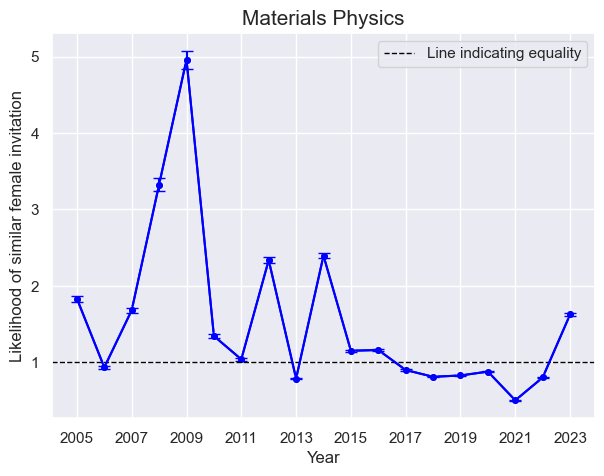

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered 

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


100%|████████████████████████████████████████████| 1/1 [02:14<00:00, 134.88s/it]

 97%|█████████████████████████████████████████▌ | 28/29 [36:41<01:19, 79.68s/it]

DPOLY



  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:48<00:00, 48.69s/it]

100%|█████████████████████████████████████████████| 1/1 [00:48<00:00, 48.69s/it]


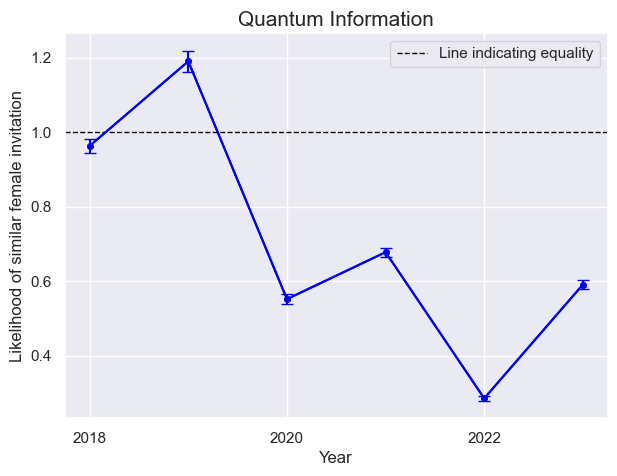

100%|███████████████████████████████████████████| 29/29 [37:30<00:00, 77.60s/it]


In [852]:
#relative likelihood for each sponsoring unit for males
relativeLikelihood_sponsoringUnits(sponsoringUnits, oneHot_researchers, 'Male', allCols, ['Male', 'Female'], ['_M', '_F'], 'blue', 'Likelihood of similar male invitation', sponsorDict)

### Potential speakers

In [958]:
potentialSpeakers_ratio, genderMatch = likelihoodEvolution(oneHot_researchers, allCols, [50], 'SessionType', ['attendee', 'invited'], 'manhattan', [0.5], 1000, ['_Att', '_Inv'])

genderMatch_df = genderMatch.reset_index().rename(columns = {'index': 'Year'}) #reset index

100%|█████████████████████████████████████████████| 1/1 [00:06<00:00,  6.74s/it]


In [959]:
#save results
potentialSpeakers_ratio.to_pickle("Files/Dataframes/potentialSpeakers.pkl")  
genderMatch_df.to_pickle("Files/Dataframes/genderMatch.pkl")  

In [960]:
years = potentialSpeakers_ratio.Year.tolist()

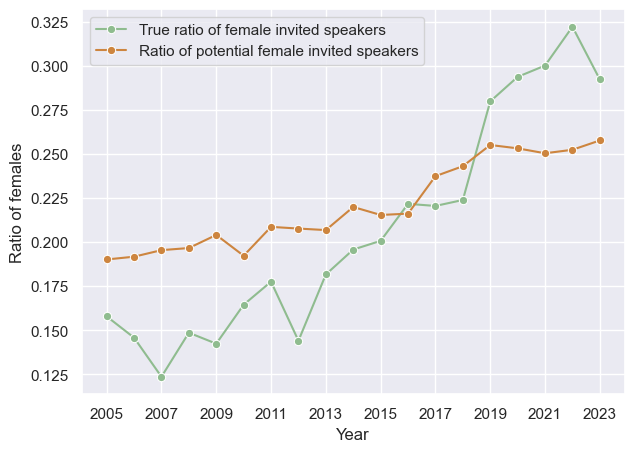

In [961]:
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'FemaleSpeakers', marker = 'o', color = 'darkseagreen', label = 'True ratio of female invited speakers')
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'PotentialFemaleSpeakers_ratio', marker = 'o', color = 'peru', label = 'Ratio of potential female invited speakers')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Ratio of females')
plt.legend()
plt.savefig("Figures/femaleSpeakers_ratio.png", bbox_inches = 'tight')
plt.show()

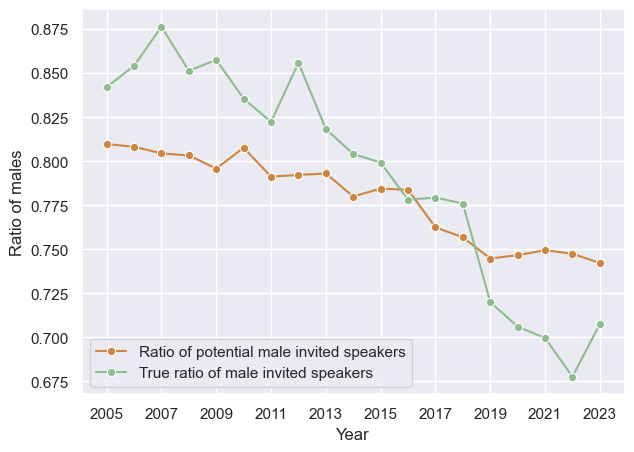

In [962]:
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'PotentialMaleSpeakers_ratio', marker = 'o', color = 'peru', label = 'Ratio of potential male invited speakers')
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'MaleSpeakers', marker = 'o', color = 'darkseagreen', label = 'True ratio of male invited speakers')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Ratio of males')
plt.legend()
plt.savefig("Figures/maleSpeakers_ratio.png", bbox_inches = 'tight')
plt.show()

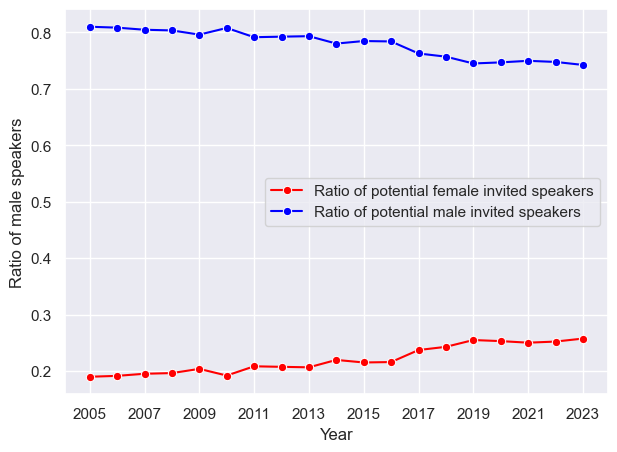

In [963]:
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'PotentialFemaleSpeakers_ratio', marker = 'o', color = 'red', label = 'Ratio of potential female invited speakers')
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'PotentialMaleSpeakers_ratio', marker = 'o', color = 'blue', label = 'Ratio of potential male invited speakers')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Ratio of male speakers')
plt.legend()
plt.savefig("Figures/potentialSpeakers_ratio.png", bbox_inches = 'tight')
plt.show()

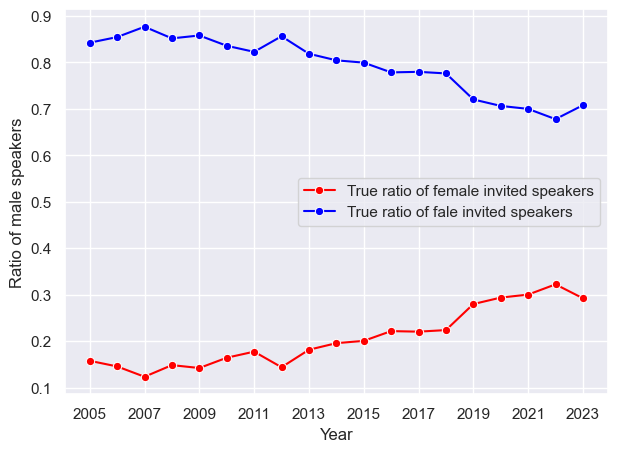

In [964]:
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'FemaleSpeakers', marker = 'o', color = 'red', label = 'True ratio of female invited speakers')
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'MaleSpeakers', marker = 'o', color = 'blue', label = 'True ratio of fale invited speakers')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Ratio of male speakers')
plt.legend()
plt.savefig("Figures/trueInvited_ratio.png", bbox_inches = 'tight')
plt.show()

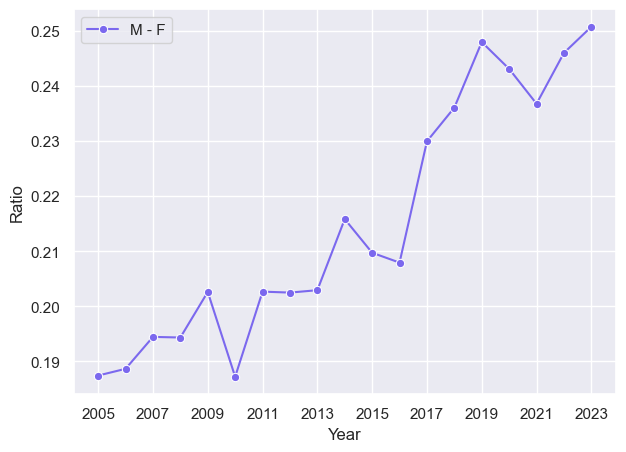

In [965]:
sns.lineplot(data = genderMatch_df, x = 'Year', y = 'Male, Female', marker = 'o', color = 'mediumslateblue', label = 'M - F')
plt.ylabel('Ratio')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.savefig("Figures/genderRelation_MF.png", bbox_inches = 'tight')
plt.show()

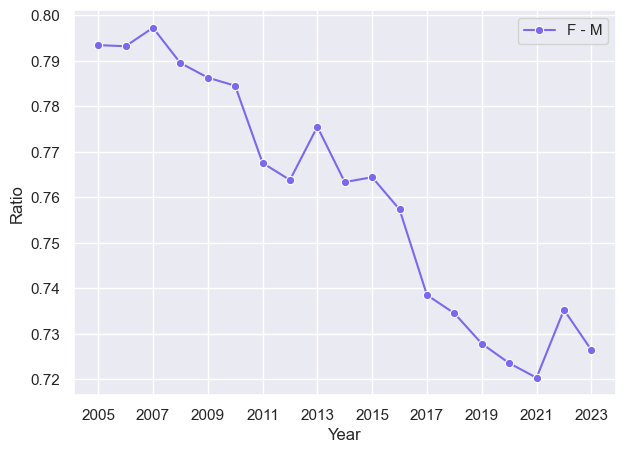

In [966]:
sns.lineplot(data = genderMatch_df, x = 'Year', y = 'Female, Male', marker = 'o', color = 'mediumslateblue', label = 'F - M')
plt.ylabel('Ratio')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.savefig("Figures/genderRelation_FM.png", bbox_inches = 'tight')
plt.show()

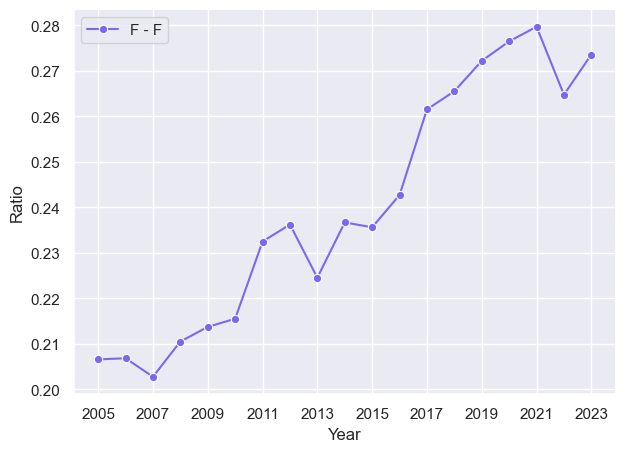

In [967]:
sns.lineplot(data = genderMatch_df, x = 'Year', y = 'Female, Female', marker = 'o', color = 'mediumslateblue', label = 'F - F')
plt.ylabel('Ratio')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.savefig("Figures/genderRelation_FF.png", bbox_inches = 'tight')
plt.show()

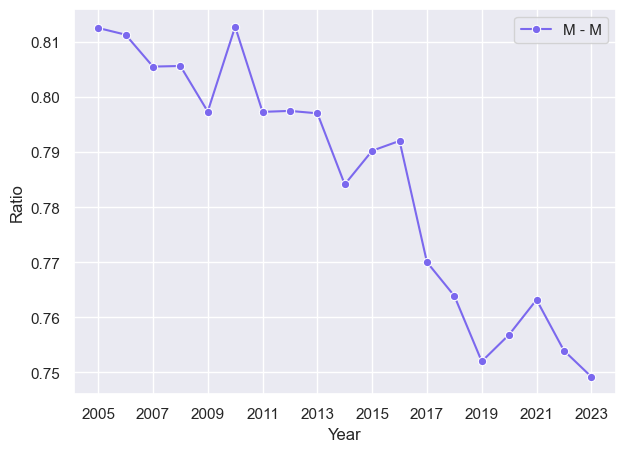

In [968]:
sns.lineplot(data = genderMatch_df, x = 'Year', y = 'Male, Male', marker = 'o', color = 'mediumslateblue', label = 'M - M')
plt.ylabel('Ratio')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.savefig("Figures/genderRelation_MM.png", bbox_inches = 'tight')
plt.show()

In [969]:
genderMatch_df.corr()

,Year,"Female, Female","Female, Male","Male, Female","Male, Male"
Year,1.000000,0.960097,-0.960097,0.943508,-0.943508
"Female, Female",0.960097,1.000000,-1.000000,0.952941,-0.952941
"Female, Male",-0.960097,-1.000000,1.000000,-0.952941,0.952941
"Male, Female",0.943508,0.952941,-0.952941,1.000000,-1.000000
"Male, Male",-0.943508,-0.952941,0.952941,-1.000000,1.000000
